In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap, maskoceans
import geopandas as gpd
from scipy.ndimage import gaussian_filter
import matplotlib.animation as animation
import random
from itertools import count
from IPython import display
import matplotlib.colors as mcolors 


In [2]:
pip install xarray numpy matplotlib cartopy geopandas scipy



     ---------------------------------------- 0.0/56.0 kB ? eta -:--:--
     ------- -------------------------------- 10.2/56.0 kB ? eta -:--:--
     ---------------------------------- --- 51.2/56.0 kB 518.5 kB/s eta 0:00:01
     ---------------------------------- --- 51.2/56.0 kB 518.5 kB/s eta 0:00:01
     -------------------------------------- 56.0/56.0 kB 324.3 kB/s eta 0:00:00
     ---------------------------------------- 0.0/51.5 kB ? eta -:--:--
     ---------------------------------------  51.2/51.5 kB ? eta -:--:--
     ---------------------------------------  51.2/51.5 kB ? eta -:--:--
     -------------------------------------- 51.5/51.5 kB 655.5 kB/s eta 0:00:00
   ---------------------------------------- 0.0/10.9 MB ? eta -:--:--
    --------------------------------------- 0.2/10.9 MB 10.9 MB/s eta 0:00:01
    --------------------------------------- 0.2/10.9 MB 10.9 MB/s eta 0:00:01
    --------------------------------------- 0.3/10.9 MB 2.7 MB/s eta 0:00:04
   - --------

In [5]:
pip install basemap



   ---------------------------------------- 0.0/507.3 kB ? eta -:--:--
   ---------------------------------------- 0.0/507.3 kB ? eta -:--:--
    --------------------------------------- 10.2/507.3 kB ? eta -:--:--
    --------------------------------------- 10.2/507.3 kB ? eta -:--:--
    --------------------------------------- 10.2/507.3 kB ? eta -:--:--
   -- ------------------------------------ 30.7/507.3 kB 163.8 kB/s eta 0:00:03
   --- ----------------------------------- 41.0/507.3 kB 196.9 kB/s eta 0:00:03
   ---- ---------------------------------- 61.4/507.3 kB 252.2 kB/s eta 0:00:02
   -------- ----------------------------- 112.6/507.3 kB 409.6 kB/s eta 0:00:01
   ------------- ------------------------ 174.1/507.3 kB 551.6 kB/s eta 0:00:01
   ----------------------- -------------- 307.2/507.3 kB 863.3 kB/s eta 0:00:01
   ------------------------------ --------- 389.1/507.3 kB 1.0 MB/s eta 0:00:01
   ---------------------------------------  501.8/507.3 kB 1.2 MB/s eta 0:00:01
 

In [7]:
pip install netCDF4 h5netcdf


   ---------------------------------------- 0.0/6.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/6.6 MB 682.7 kB/s eta 0:00:10
   ---------------------------------------- 0.1/6.6 MB 825.8 kB/s eta 0:00:08
    --------------------------------------- 0.1/6.6 MB 1.1 MB/s eta 0:00:06
    --------------------------------------- 0.1/6.6 MB 1.1 MB/s eta 0:00:06
    --------------------------------------- 0.1/6.6 MB 655.8 kB/s eta 0:00:10
   - -------------------------------------- 0.2/6.6 MB 942.1 kB/s eta 0:00:07
   -- ------------------------------------- 0.3/6.6 MB 1.1 MB/s eta 0:00:06
   -- ------------------------------------- 0.5/6.6 MB 1.3 MB/s eta 0:00:05
   --- ------------------------------------ 0.5/6.6 MB 1.4 MB/s eta 0:00:05
   ---- ----------------------------------- 0.7/6.6 MB 1.7 MB/s eta 0:00:04
   ----- ---------------------------------- 0.9/6.6 MB 1.9 MB/s eta 0:00:04
   ----- ---------------------------------- 0.9/6.6 MB 2.0 MB/s eta 0:00:03
   ----- --

<xarray.DataArray 'precip_95th' (lat: 201, lon: 281)>
[56481 values with dtype=float64]
Coordinates:
  * lat       (lat) float32 -38.0 -37.95 -37.9 -37.85 ... -28.1 -28.05 -28.0
  * lon       (lon) float32 140.0 140.1 140.1 140.1 ... 153.9 153.9 153.9 154.0
    quantile  float64 ...
Attributes:
    cell_methods:                  time: sum
    units:                         mm
    analysis_version_number:       3.01
    long_name:                     Daily precipitation
    number_of_stations_reporting:  2757
    standard_name:                 lwe_thickness_of_precipitation_amount
    frequency:                     daily
    length_scale_for_analysis:     80.0
    grid_mapping:                  crs
    coverage_content_type:         physicalMeasurement
    valid_range:                   [     0. 100000.]


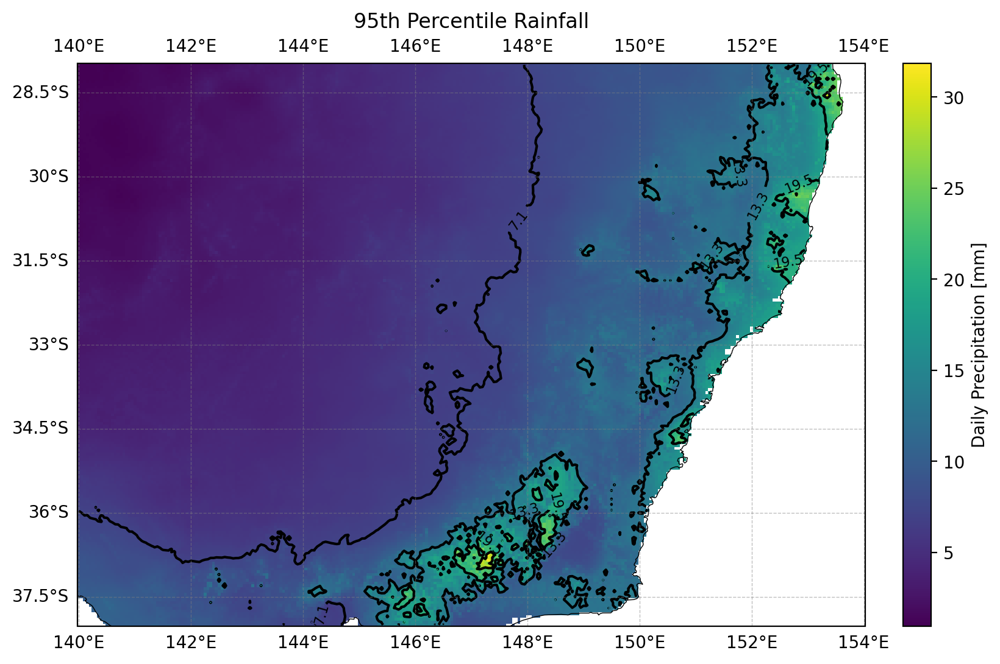

In [20]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap, maskoceans
import geopandas as gpd

# Assuming 'precip_95' is your DataArray containing the 95th percentile rainfall data
# Assuming 'lon' and 'lat' are your longitude and latitude arrays

dr=xr.open_dataset(r'C:\Users\manda\Documents\Master thesis Data\rain_perc95.nc')

precip_95=dr.precip_95th

print(precip_95)

lon=precip_95.lon
lat=precip_95.lat

# Create a new figure
plt.figure(figsize=(10, 6))

# Define the projection
projection = ccrs.PlateCarree()

# Create a subplot with the defined projection
ax = plt.subplot(1, 1, 1, projection=projection)

# Create a Basemap instance
m = Basemap(projection='cyl', resolution='l', llcrnrlon=lon.min(), llcrnrlat=lat.min(),
            urcrnrlon=lon.max(), urcrnrlat=lat.max())

# Convert latitude and longitude to map projection coordinates
lon2d, lat2d = np.meshgrid(lon, lat)
x, y = m(lon2d, lat2d)

# Convert latitude and longitude to map projection coordinates
x, y = m(lon2d, lat2d)

# Mask the oceans
masked_data = maskoceans(lon2d, lat2d, precip_95, inlands=True, resolution='l', grid=2.5)

# Plot the data using pcolormesh
mesh = ax.pcolormesh(
    x,
    y,
    masked_data,
    cmap='viridis',
    transform=projection
)

# Add labelled contours
contour_levels = np.arange(masked_data.min(), masked_data.max(), (masked_data.max()-masked_data.min())/5)
contours = ax.contour(
    lon2d, 
    lat2d, 
    masked_data, 
    levels=contour_levels, 
    colors='black', 
    transform=projection
)
ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f')

# Add coastline
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Add gridlines with latitude labels on the right side
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.right_labels = False

# Add colorbar on the right side
cbar = plt.colorbar(mesh, ax=ax, location='right', fraction=0.03, pad=0.04)
cbar.set_label('Daily Precipitation [mm]')

# Add title
plt.title('95th Percentile Rainfall')




# Show plot
plt.show()

<xarray.DataArray 'precip_95th' (lat: 201, lon: 281)>
[56481 values with dtype=float64]
Coordinates:
  * lat      (lat) float32 -38.0 -37.95 -37.9 -37.85 ... -28.1 -28.05 -28.0
  * lon      (lon) float32 140.0 140.1 140.1 140.1 ... 153.9 153.9 153.9 154.0
Attributes:
    cell_methods:                  time: sum
    units:                         mm
    analysis_version_number:       3.01
    long_name:                     Daily precipitation
    number_of_stations_reporting:  2757
    standard_name:                 lwe_thickness_of_precipitation_amount
    frequency:                     daily
    length_scale_for_analysis:     80.0
    grid_mapping:                  crs
    coverage_content_type:         physicalMeasurement
    valid_range:                   [     0. 100000.]


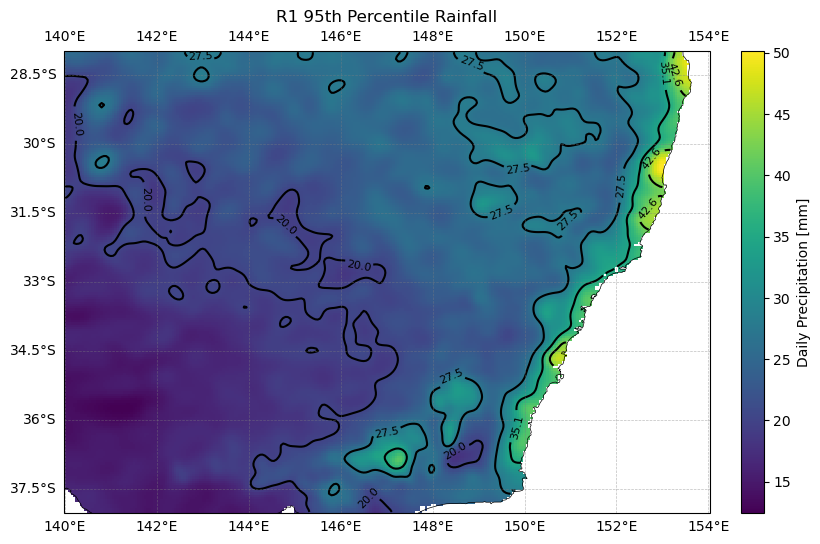

In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap, maskoceans
import geopandas as gpd
from scipy.ndimage import gaussian_filter

# Assuming 'precip_95' is your DataArray containing the 95th percentile rainfall data
# Assuming 'lon' and 'lat' are your longitude and latitude arrays

dr=xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_perc95.nc')

precip_95=dr.precip_95th

print(precip_95)


lon=precip_95.lon
lat=precip_95.lat

# Smooth the data using a Gaussian filter
sigma = 2  # Standard deviation for Gaussian kernel
smoothed_data = gaussian_filter(precip_95, sigma=sigma)


# Create a new figure
plt.figure(figsize=(10, 6))

# Define the projection
projection = ccrs.PlateCarree()

# Create a subplot with the defined projection
ax = plt.subplot(1, 1, 1, projection=projection)

# Create a Basemap instance
m = Basemap(projection='cyl', resolution='l', llcrnrlon=lon.min(), llcrnrlat=lat.min(),
            urcrnrlon=lon.max(), urcrnrlat=lat.max())

# Convert latitude and longitude to map projection coordinates
lon2d, lat2d = np.meshgrid(lon, lat)
x, y = m(lon2d, lat2d)

# Convert latitude and longitude to map projection coordinates
x, y = m(lon2d, lat2d)

# Mask the oceans
masked_data = maskoceans(lon2d, lat2d, smoothed_data, inlands=True, resolution='l', grid=2.5)

# Plot the data using pcolormesh
mesh = ax.pcolormesh(
    x,
    y,
    masked_data,
    cmap='viridis',
    transform=projection
)

# Add labelled contours
contour_levels = np.arange(masked_data.min(), masked_data.max(), (masked_data.max()-masked_data.min())/5)
contours = ax.contour(
    lon2d, 
    lat2d, 
    masked_data, 
    levels=contour_levels, 
    colors='black', 
    transform=projection
)
ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f')

# Add coastline
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Add gridlines with latitude labels on the right side
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.right_labels = False

# Add colorbar on the right side
cbar = plt.colorbar(mesh, ax=ax, location='right', fraction=0.03, pad=0.04)
cbar.set_label('Daily Precipitation [mm]')

# Add title
plt.title('R1 95th Percentile Rainfall')


# Show plot
plt.show()



<xarray.DataArray 'precip_rx3_95th' (lat: 201, lon: 281)>
[56481 values with dtype=float64]
Coordinates:
  * lat      (lat) float32 -38.0 -37.95 -37.9 -37.85 ... -28.1 -28.05 -28.0
  * lon      (lon) float32 140.0 140.1 140.1 140.1 ... 153.9 153.9 153.9 154.0
Attributes:
    cell_methods:                  time: sum
    units:                         mm
    analysis_version_number:       3.01
    long_name:                     Daily precipitation
    number_of_stations_reporting:  2757
    standard_name:                 lwe_thickness_of_precipitation_amount
    frequency:                     daily
    length_scale_for_analysis:     80.0
    grid_mapping:                  crs
    coverage_content_type:         physicalMeasurement
    valid_range:                   [     0. 100000.]


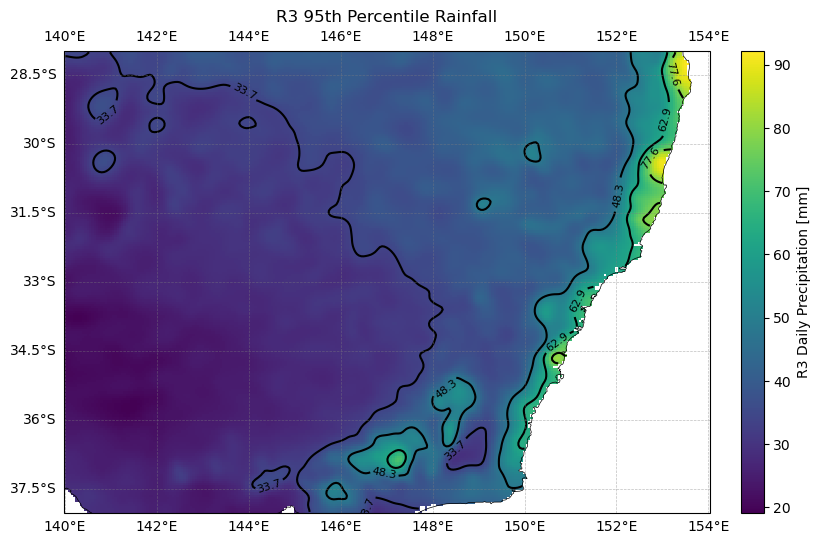

In [4]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap, maskoceans
import geopandas as gpd
from scipy.ndimage import gaussian_filter

# Assuming 'precip_95' is your DataArray containing the 95th percentile rainfall data
# Assuming 'lon' and 'lat' are your longitude and latitude arrays

dr=xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_rx3_perc95.nc')

precip_rx3_95=dr.precip_rx3_95th

print(precip_rx3_95)


lon=precip_rx3_95.lon
lat=precip_rx3_95.lat

# Smooth the data using a Gaussian filter
sigma = 2  # Standard deviation for Gaussian kernel
smoothed_data = gaussian_filter(precip_rx3_95, sigma=sigma)


# Create a new figure
plt.figure(figsize=(10, 6))

# Define the projection
projection = ccrs.PlateCarree()

# Create a subplot with the defined projection
ax = plt.subplot(1, 1, 1, projection=projection)

# Create a Basemap instance
m = Basemap(projection='cyl', resolution='l', llcrnrlon=lon.min(), llcrnrlat=lat.min(),
            urcrnrlon=lon.max(), urcrnrlat=lat.max())

# Convert latitude and longitude to map projection coordinates
lon2d, lat2d = np.meshgrid(lon, lat)
x, y = m(lon2d, lat2d)

# Convert latitude and longitude to map projection coordinates
x, y = m(lon2d, lat2d)

# Mask the oceans
masked_data = maskoceans(lon2d, lat2d, smoothed_data, inlands=True, resolution='l', grid=2.5)

# Plot the data using pcolormesh
mesh = ax.pcolormesh(
    x,
    y,
    masked_data,
    cmap='viridis',
    transform=projection
)

# Add labelled contours
contour_levels = np.arange(masked_data.min(), masked_data.max(), (masked_data.max()-masked_data.min())/5)
contours = ax.contour(
    lon2d, 
    lat2d, 
    masked_data, 
    levels=contour_levels, 
    colors='black', 
    transform=projection
)
ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f')

# Add coastline
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Add gridlines with latitude labels on the right side
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.right_labels = False

# Add colorbar on the right side
cbar = plt.colorbar(mesh, ax=ax, location='right', fraction=0.03, pad=0.04)
cbar.set_label('R3 Daily Precipitation [mm]')

# Add title
plt.title('R3 95th Percentile Rainfall')



# Show plot
plt.show()



<xarray.DataArray 'precip_99th' (lat: 201, lon: 281)>
[56481 values with dtype=float64]
Coordinates:
  * lat      (lat) float32 -38.0 -37.95 -37.9 -37.85 ... -28.1 -28.05 -28.0
  * lon      (lon) float32 140.0 140.1 140.1 140.1 ... 153.9 153.9 153.9 154.0
Attributes:
    cell_methods:                  time: sum
    units:                         mm
    analysis_version_number:       3.01
    long_name:                     Daily precipitation
    number_of_stations_reporting:  2757
    standard_name:                 lwe_thickness_of_precipitation_amount
    frequency:                     daily
    length_scale_for_analysis:     80.0
    grid_mapping:                  crs
    coverage_content_type:         physicalMeasurement
    valid_range:                   [     0. 100000.]


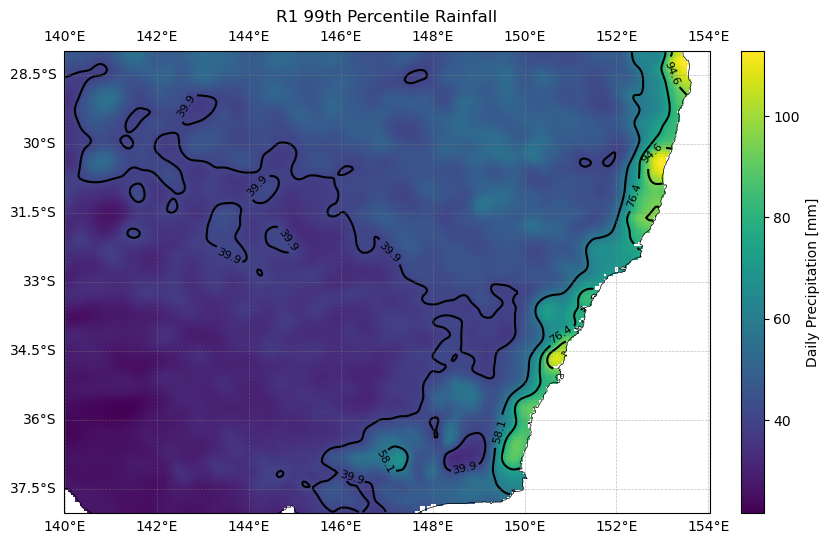

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap, maskoceans
import geopandas as gpd
from scipy.ndimage import gaussian_filter

# Assuming 'precip_95' is your DataArray containing the 95th percentile rainfall data
# Assuming 'lon' and 'lat' are your longitude and latitude arrays

dr=xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_perc99.nc')


precip_99=dr.precip_99th

print(precip_99)


lon=precip_99.lon
lat=precip_99.lat

# Smooth the data using a Gaussian filter
sigma = 2  # Standard deviation for Gaussian kernel
smoothed_data = gaussian_filter(precip_99, sigma=sigma)


# Create a new figure
plt.figure(figsize=(10, 6))

# Define the projection
projection = ccrs.PlateCarree()

# Create a subplot with the defined projection
ax = plt.subplot(1, 1, 1, projection=projection)

# Create a Basemap instance
m = Basemap(projection='cyl', resolution='l', llcrnrlon=lon.min(), llcrnrlat=lat.min(),
            urcrnrlon=lon.max(), urcrnrlat=lat.max())

# Convert latitude and longitude to map projection coordinates
lon2d, lat2d = np.meshgrid(lon, lat)
x, y = m(lon2d, lat2d)

# Convert latitude and longitude to map projection coordinates
x, y = m(lon2d, lat2d)

# Mask the oceans
masked_data = maskoceans(lon2d, lat2d, smoothed_data, inlands=True, resolution='l', grid=2.5)

# Plot the data using pcolormesh
mesh = ax.pcolormesh(
    x,
    y,
    masked_data,
    cmap='viridis',
    transform=projection
)

# Add labelled contours
contour_levels = np.arange(masked_data.min(), masked_data.max(), (masked_data.max()-masked_data.min())/5)
contours = ax.contour(
    lon2d, 
    lat2d, 
    masked_data, 
    levels=contour_levels, 
    colors='black', 
    transform=projection
)
ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f')

# Add coastline
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Add gridlines with latitude labels on the right side
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.right_labels = False

# Add colorbar on the right side
cbar = plt.colorbar(mesh, ax=ax, location='right', fraction=0.03, pad=0.04)
cbar.set_label('Daily Precipitation [mm]')

# Add title
plt.title('R1 99th Percentile Rainfall')


# Show plot
plt.show()



<xarray.DataArray 'precip_rx3_99th' (lat: 201, lon: 281)>
[56481 values with dtype=float64]
Coordinates:
  * lat      (lat) float32 -38.0 -37.95 -37.9 -37.85 ... -28.1 -28.05 -28.0
  * lon      (lon) float32 140.0 140.1 140.1 140.1 ... 153.9 153.9 153.9 154.0
Attributes:
    cell_methods:                  time: sum
    units:                         mm
    analysis_version_number:       3.01
    long_name:                     Daily precipitation
    number_of_stations_reporting:  2757
    standard_name:                 lwe_thickness_of_precipitation_amount
    frequency:                     daily
    length_scale_for_analysis:     80.0
    grid_mapping:                  crs
    coverage_content_type:         physicalMeasurement
    valid_range:                   [     0. 100000.]


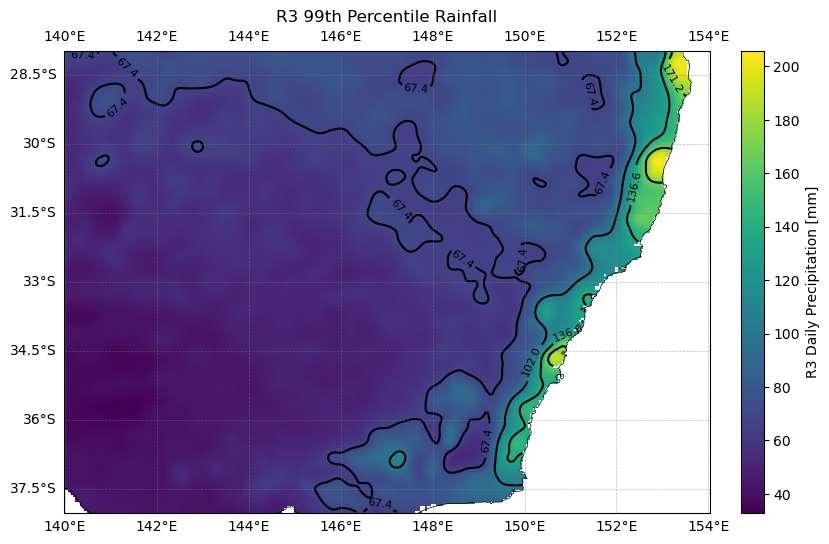

In [3]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap, maskoceans
import geopandas as gpd
from scipy.ndimage import gaussian_filter

# Assuming 'precip_95' is your DataArray containing the 95th percentile rainfall data
# Assuming 'lon' and 'lat' are your longitude and latitude arrays

dr=xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_rx3_perc99.nc')


precip_rx3_99=dr.precip_rx3_99th

print(precip_rx3_99)

lon=precip_rx3_99.lon
lat=precip_rx3_99.lat

# Smooth the data using a Gaussian filter
sigma = 2  # Standard deviation for Gaussian kernel
smoothed_data = gaussian_filter(precip_rx3_99, sigma=sigma)


# Create a new figure
plt.figure(figsize=(10, 6))

# Define the projection
projection = ccrs.PlateCarree()

# Create a subplot with the defined projection
ax = plt.subplot(1, 1, 1, projection=projection)

# Create a Basemap instance
m = Basemap(projection='cyl', resolution='l', llcrnrlon=lon.min(), llcrnrlat=lat.min(),
            urcrnrlon=lon.max(), urcrnrlat=lat.max())

# Convert latitude and longitude to map projection coordinates
lon2d, lat2d = np.meshgrid(lon, lat)
x, y = m(lon2d, lat2d)

# Convert latitude and longitude to map projection coordinates
x, y = m(lon2d, lat2d)

# Mask the oceans
masked_data = maskoceans(lon2d, lat2d, smoothed_data, inlands=True, resolution='l', grid=2.5)

# Plot the data using pcolormesh
mesh = ax.pcolormesh(
    x,
    y,
    masked_data,
    cmap='viridis',
    transform=projection
)

# Add labelled contours
contour_levels = np.arange(masked_data.min(), masked_data.max(), (masked_data.max()-masked_data.min())/5)
contours = ax.contour(
    lon2d, 
    lat2d, 
    masked_data, 
    levels=contour_levels, 
    colors='black', 
    transform=projection
)
ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f')

# Add coastline
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Add gridlines with latitude labels on the right side
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.right_labels = False

# Add colorbar on the right side
cbar = plt.colorbar(mesh, ax=ax, location='right', fraction=0.03, pad=0.04)
cbar.set_label('R3 Daily Precipitation [mm]')

# Add title
plt.title('R3 99th Percentile Rainfall')


# Show plot
plt.show()



# Plot New South Wales border from GeoJSON file
nsw_border_gdf = gpd.read_file(r'C:\Users\manda\Downloads\NSW_SA3 (1).json')
nsw_border_gdf.plot(ax=ax, edgecolor='black', linewidth=1, facecolor='none')

In [71]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

# Read GeoJSON file
nsw_border_gdf = gpd.read_file(r'C:\Users\manda\Downloads\NSW_SA3 (1).json')

# Display GeoDataFrame
display(nsw_border_gdf)



,SA3_CODE21,SA3_NAME21,CHG_FLAG21,CHG_LBL21,SA4_CODE21,SA4_NAME21,GCC_CODE21,GCC_NAME21,STE_CODE21,STE_NAME21,AUS_CODE21,AUS_NAME21,AREASQKM21,LOCI_URI21,geometry
0,10102,Queanbeyan,0,No change,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,6511.3971,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"POLYGON ((149.97901 -35.50245, 149.98038 -35.4..."
1,10103,Snowy Mountains,0,No change,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,14284.5857,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"POLYGON ((149.09727 -35.77731, 149.09578 -35.7..."
2,10104,South Coast,0,No change,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,9864.4876,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"MULTIPOLYGON (((149.94643 -36.94930, 149.94714..."
3,10105,Goulburn - Mulwaree,0,No change,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,9099.9087,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"POLYGON ((149.01139 -33.93274, 149.01023 -33.9..."
4,10106,Young - Yass,0,No change,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,12135.8653,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"POLYGON ((147.71367 -34.16161, 147.71269 -34.1..."
5,10201,Gosford,0,No change,102,Central Coast,1GSYD,Greater Sydney,1,New South Wales,AUS,Australia,988.3863,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"MULTIPOLYGON (((151.31497 -33.55578, 151.31706..."
6,10202,Wyong,0,No change,102,Central Coast,1GSYD,Greater Sydney,1,New South Wales,AUS,Australia,692.6225,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"MULTIPOLYGON (((151.57267 -33.29069, 151.57193..."
7,10301,Bathurst,0,No change,103,Central West,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,6984.1829,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"POLYGON ((149.32296 -33.05914, 149.32439 -33.0..."
8,10302,Lachlan Valley,0,No change,103,Central West,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,41000.7206,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"POLYGON ((149.12640 -33.86641, 149.12363 -33.8..."
9,10303,Lithgow - Mudgee,0,No change,103,Central West,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,16044.6243,http://linked.data.gov.au/dataset/asgsed3/SA3/...,"POLYGON ((150.55874 -32.75773, 150.55637 -32.7..."


In [9]:
import pandas as pd
import xarray as xr

# Load the Excel file
file_path = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'
sheet_name = 'Sheet1'
# Load the data from the Excel file
stations_df = pd.read_excel(file_path, sheet_name=sheet_name)

# Load the NetCDF file
dr = xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_perc99.nc')
prcp = dr.precip_99th

# Create a list to store the 99th percentile precipitation values
r1_99_values = []

# Loop through each station in the DataFrame
for index, row in stations_df.iterrows():
    lat = row['Latitude ']
    lon = row['Longitude ']
    # Select the nearest value for the given coordinates
    x = prcp.sel(lat=lat, lon=lon, method='nearest')
    # Append the value to the list
    r1_99_values.append(x.values)

# Add the new column to the DataFrame
stations_df['R1_99'] = r1_99_values

# Save the updated DataFrame back to the same Excel sheet without creating a new sheet
with pd.ExcelWriter(file_path, engine='openpyxl', mode='a', if_sheet_exists='overlay') as writer:
    # Write the updated DataFrame back to the same sheet
    stations_df.to_excel(writer, index=False, sheet_name=sheet_name)

In [10]:
import pandas as pd
import xarray as xr

# Load the Excel file
file_path = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'
sheet_name = 'Sheet1'
# Load the data from the Excel file
stations_df = pd.read_excel(file_path, sheet_name=sheet_name)

# Load the NetCDF file
dr = xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_perc95.nc')
prcp = dr.precip_95th

# Create a list to store the 95th percentile precipitation values
r1_95_values = []

# Loop through each station in the DataFrame
for index, row in stations_df.iterrows():
    lat = row['Latitude ']
    lon = row['Longitude ']
    # Select the nearest value for the given coordinates
    x = prcp.sel(lat=lat, lon=lon, method='nearest')
    # Append the value to the list
    r1_95_values.append(x.values)

# Add the new column to the DataFrame
stations_df['R1_95'] = r1_95_values

# Save the updated DataFrame back to the same Excel sheet without creating a new sheet
with pd.ExcelWriter(file_path, engine='openpyxl', mode='a', if_sheet_exists='overlay') as writer:
    # Write the updated DataFrame back to the same sheet
    stations_df.to_excel(writer, index=False, sheet_name=sheet_name)

In [11]:
import pandas as pd
import xarray as xr

# Load the Excel file
file_path = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'
sheet_name = 'Sheet1'
# Load the data from the Excel file
stations_df = pd.read_excel(file_path, sheet_name=sheet_name)

# Load the NetCDF file
dr = xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_rx3_perc95.nc')
prcp = dr.precip_rx3_95th

# Create a list to store the 95th percentile precipitation values
r3_95_values = []

# Loop through each station in the DataFrame
for index, row in stations_df.iterrows():
    lat = row['Latitude ']
    lon = row['Longitude ']
    # Select the nearest value for the given coordinates
    x = prcp.sel(lat=lat, lon=lon, method='nearest')
    # Append the value to the list
    r3_95_values.append(x.values)

# Add the new column to the DataFrame
stations_df['R3_95'] = r3_95_values

# Save the updated DataFrame back to the same Excel sheet without creating a new sheet
with pd.ExcelWriter(file_path, engine='openpyxl', mode='a', if_sheet_exists='overlay') as writer:
    # Write the updated DataFrame back to the same sheet
    stations_df.to_excel(writer, index=False, sheet_name=sheet_name)

In [12]:
import pandas as pd
import xarray as xr

# Load the Excel file
file_path = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'
sheet_name = 'Sheet1'
# Load the data from the Excel file
stations_df = pd.read_excel(file_path, sheet_name=sheet_name)

# Load the NetCDF file
dr = xr.open_dataset(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\rain_rx3_perc99.nc')
prcp = dr.precip_rx3_99th

# Create a list to store the 95th percentile precipitation values
r3_99_values = []

# Loop through each station in the DataFrame
for index, row in stations_df.iterrows():
    lat = row['Latitude ']
    lon = row['Longitude ']
    # Select the nearest value for the given coordinates
    x = prcp.sel(lat=lat, lon=lon, method='nearest')
    # Append the value to the list
    r3_99_values.append(x.values)

# Add the new column to the DataFrame
stations_df['R3_99'] = r3_99_values

# Save the updated DataFrame back to the same Excel sheet without creating a new sheet
with pd.ExcelWriter(file_path, engine='openpyxl', mode='a', if_sheet_exists='overlay') as writer:
    # Write the updated DataFrame back to the same sheet
    stations_df.to_excel(writer, index=False, sheet_name=sheet_name)

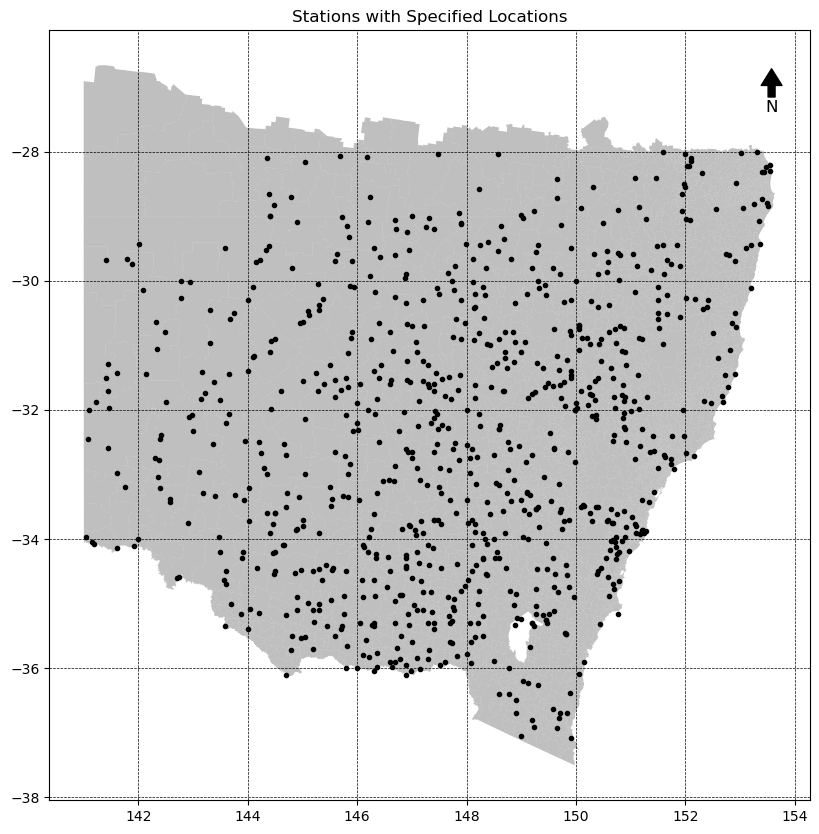

In [12]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Path to the combined shapefile
combined_shapefile = r'C:\Users\RUCHITSANDIP\Downloads\Downloads\combined_shapefile.shp'

# Read the combined shapefile
combined_gdf = gpd.read_file(combined_shapefile)

# Path to your Excel file containing station data
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'

# Read the Excel file
station_df = pd.read_excel(excel_file)

# Clean latitude and longitude columns
station_df['Latitude '] = station_df['Latitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)
station_df['Longitude '] = station_df['Longitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)

# Extract latitude and longitude columns from the DataFrame
latitudes = station_df['Latitude ']
longitudes = station_df['Longitude ']

# Create a base plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the figure size as needed

# Set the background color to white
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

# Plot the combined shapefile without borders
combined_gdf.plot(ax=ax, color='gray', alpha=0.5, edgecolor='none')

# Plot the stations as points
plt.scatter(longitudes, latitudes, color='black', marker='.', zorder=5)

# Customize the plot appearance
ax.set_axis_on()  # Hide the axes
ax.grid(True, color='black', linestyle='--', linewidth=0.5)

# Add a north arrow
x, y, arrow_length = 0.95, 0.95, 0.05
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

# Set plot title
ax.set_title('Stations with Specified Locations')

# Show the plot
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


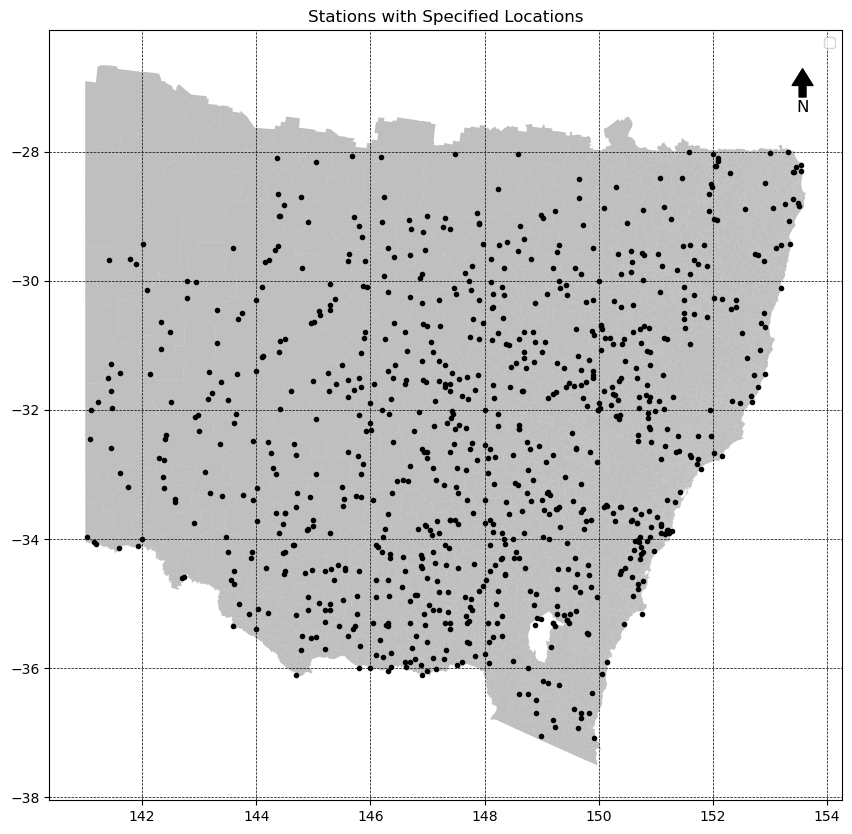

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Path to your GeoJSON files
geojson_file1 = r'C:\Users\RUCHITSANDIP\Downloads\Downloads\suburb-10-nsw.geojson'
geojson_file2 = r'C:\Users\RUCHITSANDIP\Downloads\Downloads\suburb-10-qld.geojson'

# Read the GeoJSON files
gdf1 = gpd.read_file(geojson_file1)
gdf2 = gpd.read_file(geojson_file2)

# Filter GeoDataFrames based on latitude and longitude range
gdf1_filtered = gdf1.cx[140:154, -38:-28]
gdf2_filtered = gdf2.cx[140:154, -38:-28]

# Path to your Excel file containing station data
excel_file = r'C:\Users\RUCHITSANDIP\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'

# Read the Excel file
station_df = pd.read_excel(excel_file)

# Clean latitude and longitude columns
station_df['Latitude '] = station_df['Latitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)
station_df['Longitude '] = station_df['Longitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)

# Extract latitude and longitude columns from the DataFrame
latitudes = station_df['Latitude ']
longitudes = station_df['Longitude ']

# Create a base plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the figure size as needed

# Set the background color to white
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

# Plot the filtered GeoDataFrames without borders
gdf1_filtered.plot(ax=ax, color='gray', alpha=0.5, edgecolor='none')
gdf2_filtered.plot(ax=ax, color='gray', alpha=0.5, edgecolor='none')

# Plot the stations as points
plt.scatter(longitudes, latitudes, color='black', marker='.', zorder=5)

# Customize the plot appearance
ax.set_axis_on()  # Hide the axes

ax.grid(True, color='black', linestyle='--', linewidth=0.5)

# Add a legend
ax.legend()

# Add a north arrow
x, y, arrow_length = 0.95, 0.95, 0.05
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, xycoords=ax.transAxes)
# Set plot title
ax.set_title('Stations with Specified Locations')

# Show the plot
plt.show()

In [18]:
import pandas as pd

# Define the directory and file name
directory =  r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\AshcroftL_AllYears'
file_name = '061081.csv'
file_path = f"{directory}/{file_name}"

# Load the CSV file
df = pd.read_csv(file_path)

# Remove spaces in the "Rainfall" column (assuming the column is named 'Rainfall')
df['Rainfall'] = df['Rainfall'].str.replace(' ', '')

# Save the modified CSV back to the same file
df.to_csv(file_path, index=False)

print("Spaces in the 'Rainfall' column have been removed.")


AttributeError: Can only use .str accessor with string values!

Enter day (1-31):  17
Enter month (1-12):  1
Enter year:  1891


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


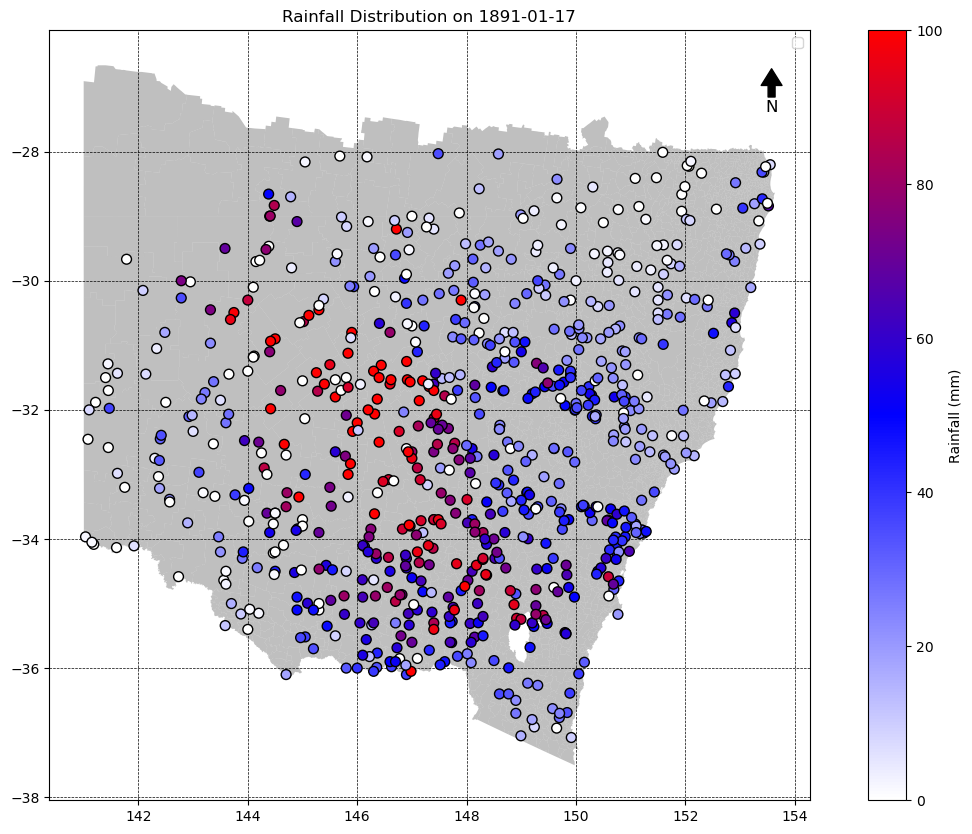

In [21]:
import os
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# Path to the combined shapefile
combined_shapefile = r'C:\Users\RUCHITSANDIP\Downloads\Downloads\combined_shapefile.shp'

# Read the combined shapefile
combined_gdf = gpd.read_file(combined_shapefile)

# Path to your Excel file containing station data
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'

# Read the Excel file
station_df = pd.read_excel(excel_file)

# Clean latitude and longitude columns
station_df['Latitude '] = station_df['Latitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)
station_df['Longitude '] = station_df['Longitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)

# Prompt user to enter the day, month, and year
day = int(input("Enter day (1-31): "))
month = int(input("Enter month (1-12): "))
year = int(input("Enter year: "))

# Define the directory containing the station CSV files
directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\AshcroftL_AllYears'

# Initialize a list to store rainfall data
rainfall_data = []

# Iterate through each station in the station_df
for index, row in station_df.iterrows():
    station_number = row['Bureau of Meteorology Station Number']
    latitude = row['Latitude ']
    longitude = row['Longitude ']
    
    # Find the corresponding CSV file in the directory
    csv_file = os.path.join(directory, f'0{station_number}.csv')
    
    # Check if the CSV file exists
    if os.path.exists(csv_file):
        # Read the CSV file into a DataFrame
        df_station = pd.read_csv(csv_file)
        
        # Filter rows for the specified date
        date_mask = (df_station['Year'] == year) & (df_station['Month'] == month) & (df_station['Day'] == day)
        df_filtered = df_station[date_mask]
        
        # Check if there is a valid rainfall value
        if not df_filtered.empty and df_filtered['Rainfall'].iloc[0] not in [None, -99.9, '']:
            rainfall = df_filtered['Rainfall'].iloc[0]
            rainfall_data.append({'Station Number': station_number, 'Latitude': latitude, 'Longitude': longitude, 'Rainfall': rainfall})

# Convert the rainfall data to a DataFrame
rainfall_df = pd.DataFrame(rainfall_data)

# Create a base plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the figure size as needed

# Set the background color to white
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

# Plot the combined shapefile without borders
combined_gdf.plot(ax=ax, color='gray', alpha=0.5, edgecolor='none')

# Set color map for rainfall intensity from green to blue to red
cmap = mcolors.LinearSegmentedColormap.from_list('rainfall', ['white', 'blue', 'red'])
norm = plt.Normalize(vmin=0, vmax=100)  # Normalization range from 0 to 100 mm

# Plot the stations with color-coded markers based on rainfall values
sc = plt.scatter(
    rainfall_df['Longitude'],
    rainfall_df['Latitude'],
    c=rainfall_df['Rainfall'],
    cmap=cmap,
    norm=norm,
    s=50,  # Marker size
    edgecolor='black',
    zorder=5
)

# Add a colorbar to the plot
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Rainfall (mm)')

# Customize the plot appearance
ax.set_axis_on()  # Hide the axes
ax.grid(True, color='black', linestyle='--', linewidth=0.5)

# Add a legend
ax.legend()

# Add a north arrow
x, y, arrow_length = 0.95, 0.95, 0.05
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

# Set plot title
ax.set_title(f'Rainfall Distribution on {year}-{month:02d}-{day:02d}')

# Show the plot
plt.show()


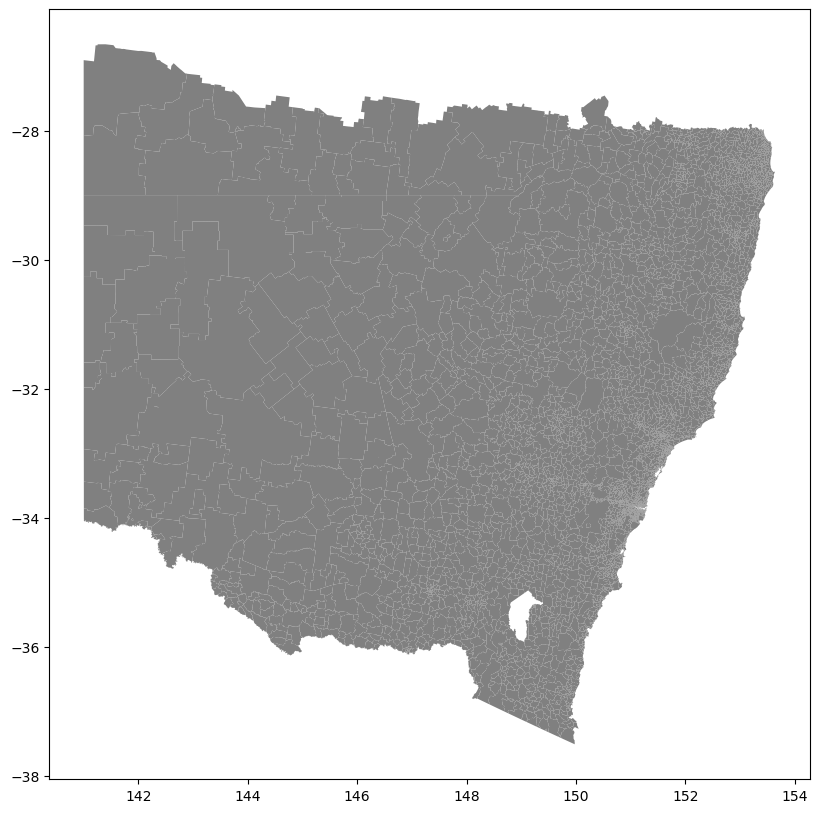

In [23]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Path to the combined shapefile
combined_shapefile =r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\combined_shapefile.shp'

# Read the combined shapefile
combined_gdf = gpd.read_file(combined_shapefile)

# Plot the combined shapefile
fig, ax = plt.subplots(figsize=(10, 10))
combined_gdf.plot(ax=ax, color='gray', edgecolor='none')
plt.show()


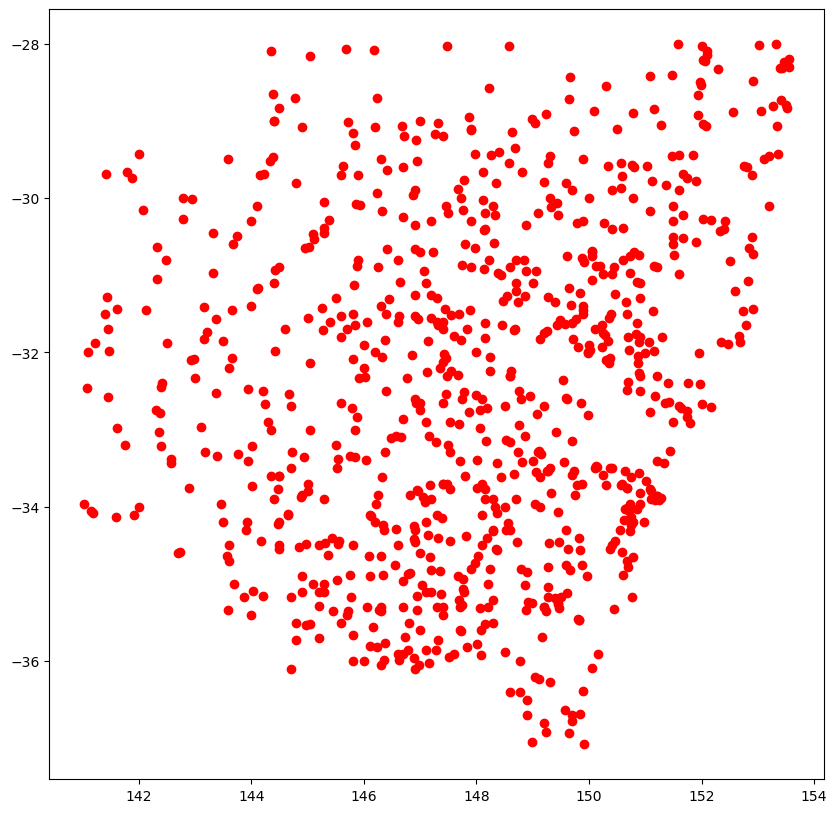

In [24]:
import pandas as pd

# Path to your Excel file containing station data
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'

# Read the Excel file
station_df = pd.read_excel(excel_file)

# Clean latitude and longitude columns
station_df['Latitude '] = station_df['Latitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)
station_df['Longitude '] = station_df['Longitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)

# Plot the stations
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(station_df['Longitude '], station_df['Latitude '], color='red', marker='o')
plt.show()


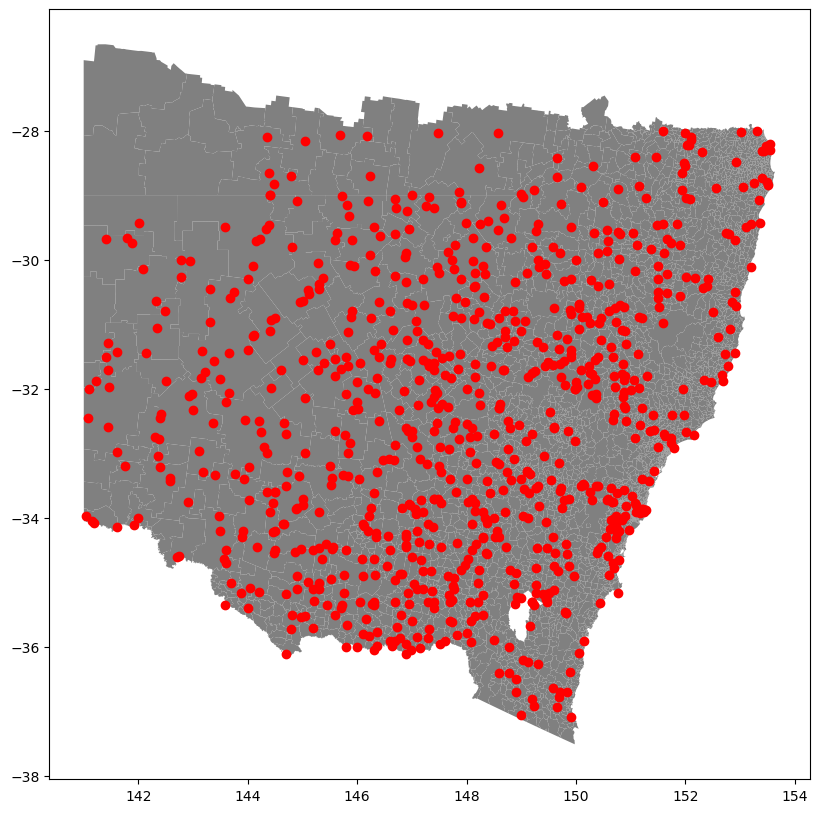

In [25]:
# Plot both shapefile and stations
fig, ax = plt.subplots(figsize=(10, 10))
combined_gdf.plot(ax=ax, color='gray', edgecolor='none')
ax.scatter(station_df['Longitude '], station_df['Latitude '], color='red', marker='o')
plt.show()


In [28]:
import os
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Path to your Excel file containing station data
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'

# Read the Excel file
station_df = pd.read_excel(excel_file)

# Clean latitude and longitude columns
station_df['Latitude '] = station_df['Latitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)
station_df['Longitude '] = station_df['Longitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)

# Define the directory containing the station CSV files
directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\AshcroftL_AllYears'

# Function to plot and save map for a specific date
def plot_and_save_map(date):
    # Extract year, month, and day
    year, month, day = date.year, date.month, date.day
    
    # Create a base plot
    fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the figure size as needed

    # Set the background color to white
    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')

    # Set plot title
    ax.set_title(f'Rainfall Distribution on {year}-{month:02d}-{day:02d}')

    # Plot the combined shapefile
    combined_gdf.plot(ax=ax, color='gray', alpha=0.5, edgecolor='none')

    # Load and plot rainfall data for the current date
    rainfall_data = []
    for index, row in station_df.iterrows():
        station_number = row['Bureau of Meteorology Station Number']
        latitude = row['Latitude ']
        longitude = row['Longitude ']

        # Find the corresponding CSV file in the directory
        csv_file = os.path.join(directory, f'0{station_number}.csv')

        # Check if the CSV file exists
        if os.path.exists(csv_file):
            # Read the CSV file into a DataFrame
            df_station = pd.read_csv(csv_file)

            # Filter rows for the specified date
            date_mask = (df_station['Year'] == year) & (df_station['Month'] == month) & (df_station['Day'] == day)
            df_filtered = df_station[date_mask]

            # Check if there is a valid rainfall value
            if not df_filtered.empty and df_filtered['Rainfall'].iloc[0] not in [None, -99.9, '']:
                rainfall = df_filtered['Rainfall'].iloc[0]
                rainfall_data.append({'Station Number': station_number, 'Latitude': latitude, 'Longitude': longitude, 'Rainfall': rainfall})

    # Convert the rainfall data to a DataFrame
    rainfall_df = pd.DataFrame(rainfall_data)

    # Set color map for rainfall intensity from green to blue to red
    cmap = mcolors.LinearSegmentedColormap.from_list('rainfall', ['white', 'blue', 'red'])
    norm = plt.Normalize(vmin=0, vmax=100)  # Normalization range from 0 to 100 mm

    # Plot the stations with color-coded markers based on rainfall values
    sc = ax.scatter(
        rainfall_df['Longitude'],
        rainfall_df['Latitude'],
        c=rainfall_df['Rainfall'],
        cmap=cmap,
        norm=norm,
        s=50,  # Marker size
        edgecolor='black',
        zorder=5
    )

    # Add a colorbar to the plot
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Rainfall (mm)')

    # Customize the plot appearance
    ax.set_axis_on()  # Hide the axes
    ax.grid(True, color='black', linestyle='--', linewidth=0.5)

    # Add a north arrow
    x, y, arrow_length = 0.95, 0.95, 0.05
    ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

    # Save the plot
    output_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'
    output_file = os.path.join(output_directory, f'Rainfall_Map_{year}-{month:02d}-{day:02d}.png')
    plt.savefig(output_file)
    plt.close()

# Prompt user to enter start and end date for the map generation
start_date = pd.to_datetime(input("Enter start date (YYYY-MM-DD): "))
end_date = pd.to_datetime(input("Enter end date (YYYY-MM-DD): "))

# Generate and save maps for each day within the date range
current_date = start_date
while current_date <= end_date:
    plot_and_save_map(current_date)
    current_date += pd.Timedelta(days=1)

print("Maps have been generated and saved successfully.")


Enter start date (YYYY-MM-DD):  1891-01-15
Enter end date (YYYY-MM-DD):  1891-01-18


Maps have been generated and saved successfully.


The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots_animation\Rainfall_Distribution1891-01-15_to_1891-01-18.gif'.


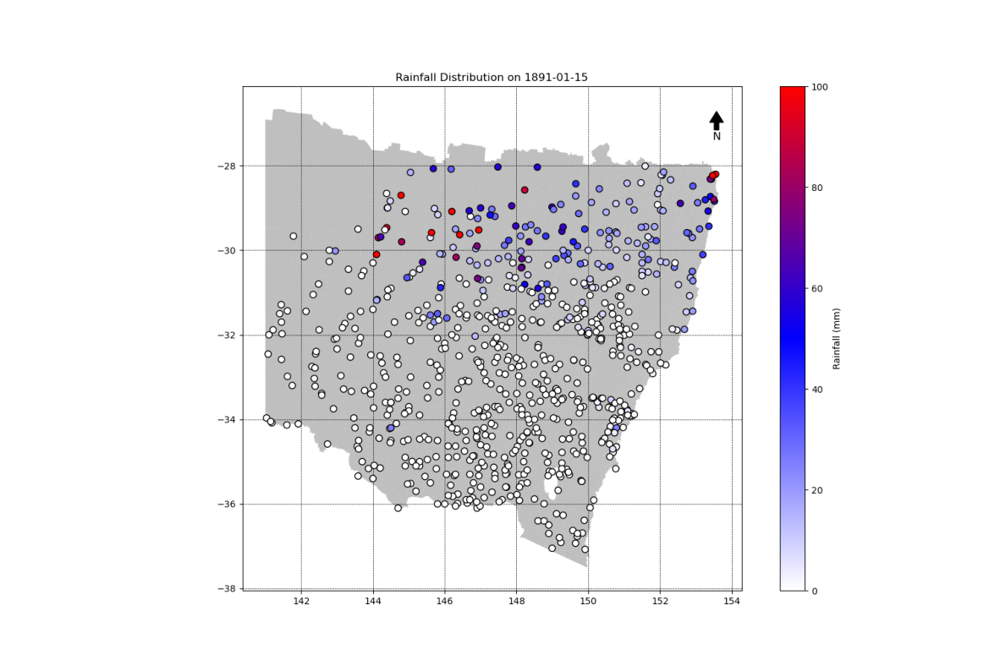

In [42]:
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

# Directory containing the map plots
directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

# Get list of files in the directory
files = sorted([f for f in os.listdir(directory) if f.endswith('.png')])

# Create a figure and axis for the animation
fig, ax = plt.subplots(figsize=(15, 15), dpi=100)  # Adjust size and DPI as needed

# Initialize function to update each frame
def update(frame):
    ax.clear()
    img = plt.imread(os.path.join(directory, files[frame]))
    ax.imshow(img)
    ax.axis('off')

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(files), interval=500)  # Adjust interval for animation speed

# Clear previous output
clear_output(wait=True)

# Save the animation as a GIF
output_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots_animation'
start_date = files[0].split('_')[-1].split('.')[0]
end_date = files[-1].split('_')[-1].split('.')[0]
output_file = os.path.join(output_directory, f'Rainfall_Distribution{start_date}_to_{end_date}.gif')
ani.save(output_file, writer='pillow', fps=2)

# Display the animation with reduced gap
animation_html = ani.to_jshtml()
animation_html = animation_html.replace('<div', '<div style="margin-top: -5px"')  # Adjust margin-top as needed
display(HTML(animation_html))

print(f"The animation has been saved as '{output_file}'.")


In [45]:
import os
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import re

# Path to the Excel file containing event data
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\R1_99_New Events.xlsx'

# Read the Excel file, considering Sheet 2
event_df = pd.read_excel(excel_file, sheet_name='Sheet2')

# Directory containing the station CSV files
directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\AshcroftL_AllYears'

# Path to save map plots
output_base_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

def extract_date_range(event_text):
    if pd.isna(event_text):
        return None, None
    pattern = r'\d{4}-\d{2}-\d{2}'
    dates = re.findall(pattern, event_text)
    if len(dates) == 2:
        return pd.to_datetime(dates[0]), pd.to_datetime(dates[1])
    else:
        return None, None

# Function to plot and save map for a specific date
def plot_and_save_map(date, output_directory):
    # Extract year, month, and day
    year, month, day = date.year, date.month, date.day
    
    # Create a base plot
    fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the figure size as needed

    # Set the background color to white
    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')

    # Set plot title
    ax.set_title(f'Rainfall Distribution on {year}-{month:02d}-{day:02d}')

    # Plot the combined shapefile
    combined_gdf.plot(ax=ax, color='gray', alpha=0.5, edgecolor='none')

    # Load and plot rainfall data for the current date
    rainfall_data = []
    for index, row in station_df.iterrows():
        station_number = row['Bureau of Meteorology Station Number']
        latitude = row['Latitude ']
        longitude = row['Longitude ']

        # Find the corresponding CSV file in the directory
        csv_file = os.path.join(directory, f'0{station_number}.csv')

        # Check if the CSV file exists
        if os.path.exists(csv_file):
            # Read the CSV file into a DataFrame
            df_station = pd.read_csv(csv_file)

            # Filter rows for the specified date
            date_mask = (df_station['Year'] == year) & (df_station['Month'] == month) & (df_station['Day'] == day)
            df_filtered = df_station[date_mask]

            # Check if there is a valid rainfall value
            if not df_filtered.empty and df_filtered['Rainfall'].iloc[0] not in [None, -99.9, '']:
                rainfall = df_filtered['Rainfall'].iloc[0]
                rainfall_data.append({'Station Number': station_number, 'Latitude': latitude, 'Longitude': longitude, 'Rainfall': rainfall})

    # Convert the rainfall data to a DataFrame
    rainfall_df = pd.DataFrame(rainfall_data)

    # Set color map for rainfall intensity from green to blue to red
    cmap = mcolors.LinearSegmentedColormap.from_list('rainfall', ['white', 'blue', 'red'])
    norm = plt.Normalize(vmin=0, vmax=100)  # Normalization range from 0 to 100 mm

    # Plot the stations with color-coded markers based on rainfall values
    sc = ax.scatter(
        rainfall_df['Longitude'],
        rainfall_df['Latitude'],
        c=rainfall_df['Rainfall'],
        cmap=cmap,
        norm=norm,
        s=50,  # Marker size
        edgecolor='black',
        zorder=5
    )

    # Add a colorbar to the plot
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Rainfall (mm)')

    # Customize the plot appearance
    ax.set_axis_on()  # Hide the axes
    ax.grid(True, color='black', linestyle='--', linewidth=0.5)

    # Add a north arrow
    x, y, arrow_length = 0.95, 0.95, 0.05
    ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

    # Save the plot
    output_file = os.path.join(output_directory, f'Rainfall_Map_{year}-{month:02d}-{day:02d}.png')
    plt.savefig(output_file)
    plt.close()

# Iterate through each event and generate maps
for index, row in event_df.iterrows():
    # Extract event information
    event_text = row['Event']
    start_date, end_date = extract_date_range(event_text)
    
    if start_date is not None and end_date is not None:
        # Create a new directory for the event
        event_directory = os.path.join(output_base_directory, event_text)
        os.makedirs(event_directory, exist_ok=True)
        
        # Generate and save maps for each day within the date range
        current_date = start_date
        while current_date <= end_date:
            plot_and_save_map(current_date, event_directory)
            current_date += pd.Timedelta(days=1)

print("Maps have been generated and saved successfully.")


Maps have been generated and saved successfully.


The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots_animation\Event 2_1887-01-19_to_1887-01-25.gif'.


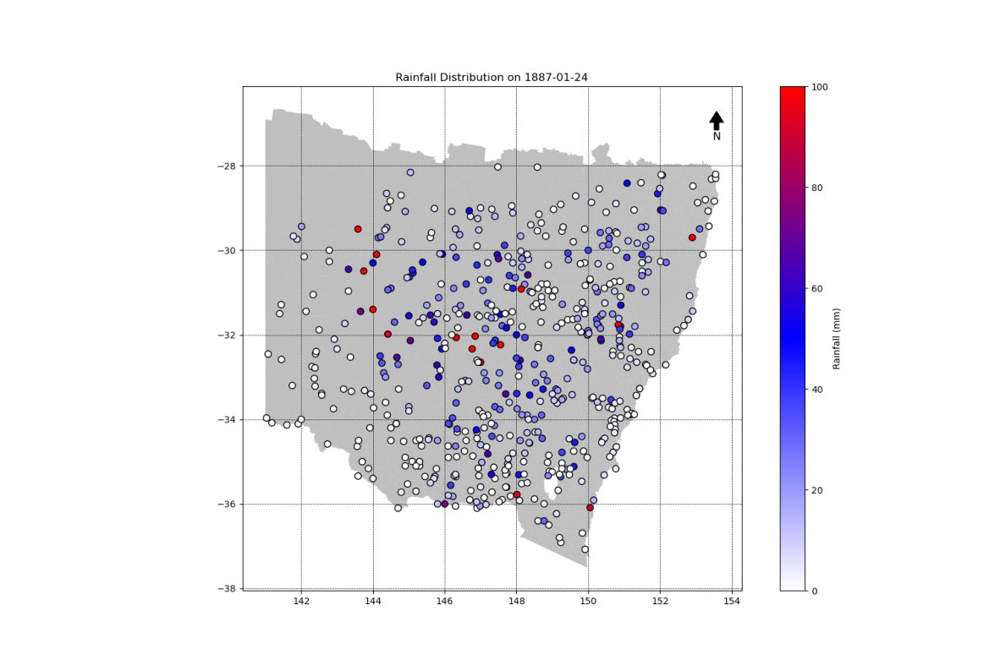

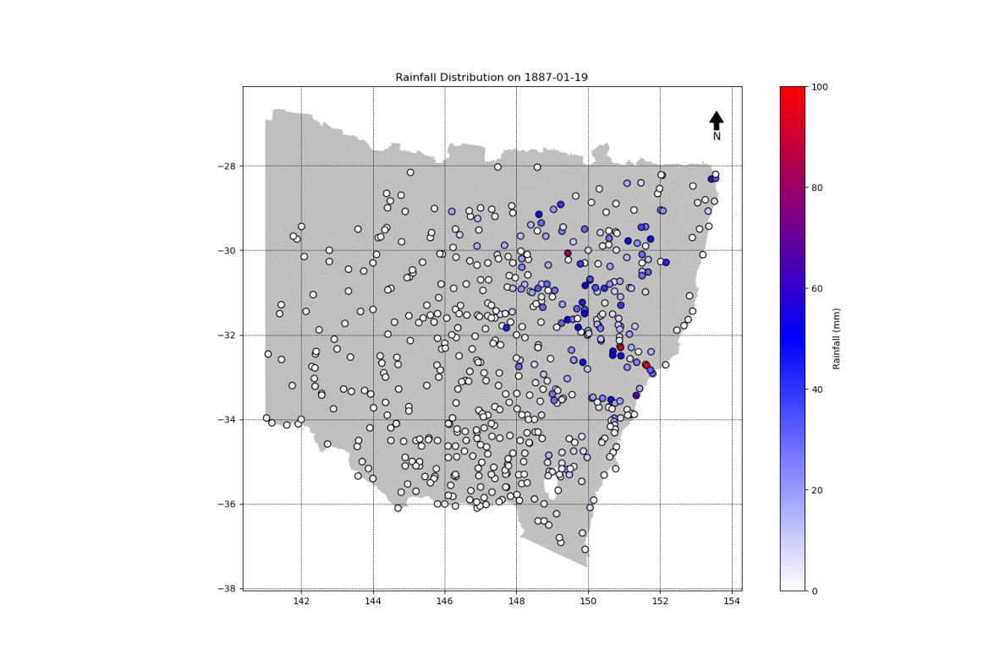

In [46]:
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

# Directory containing the map plots
map_plots_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

# Get list of directories in the map plots directory
event_directories = [d for d in os.listdir(map_plots_directory) if os.path.isdir(os.path.join(map_plots_directory, d))]

# Iterate through each event directory
for event_directory in event_directories:
    # Get the event name from the directory name
    event_name = event_directory.split(' - ')[0]
    
    # Directory containing the map plots for this event
    event_plots_directory = os.path.join(map_plots_directory, event_directory)
    
    # Get list of files in the event directory
    files = sorted([f for f in os.listdir(event_plots_directory) if f.endswith('.png')])
    
    # Create a figure and axis for the animation
    fig, ax = plt.subplots(figsize=(15, 15), dpi=100)  # Adjust size and DPI as needed
    
    # Initialize function to update each frame
    def update(frame):
        ax.clear()
        img = plt.imread(os.path.join(event_plots_directory, files[frame]))
        ax.imshow(img)
        ax.axis('off')

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(files), interval=500)  # Adjust interval for animation speed
    
    # Clear previous output
    clear_output(wait=True)

    # Save the animation as a GIF
    map_plots_animation_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots_animation'
    start_date = files[0].split('_')[-1].split('.')[0]
    end_date = files[-1].split('_')[-1].split('.')[0]
    output_file = os.path.join(map_plots_animation_directory, f'{event_name}_{start_date}_to_{end_date}.gif')
    ani.save(output_file, writer='pillow', fps=2)

# Display the animation with reduced gap
animation_html = ani.to_jshtml()
animation_html = animation_html.replace('<div', '<div style="margin-top: -5px"')  # Adjust margin-top as needed
display(HTML(animation_html))

print(f"The animation has been saved as '{output_file}'.")


ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

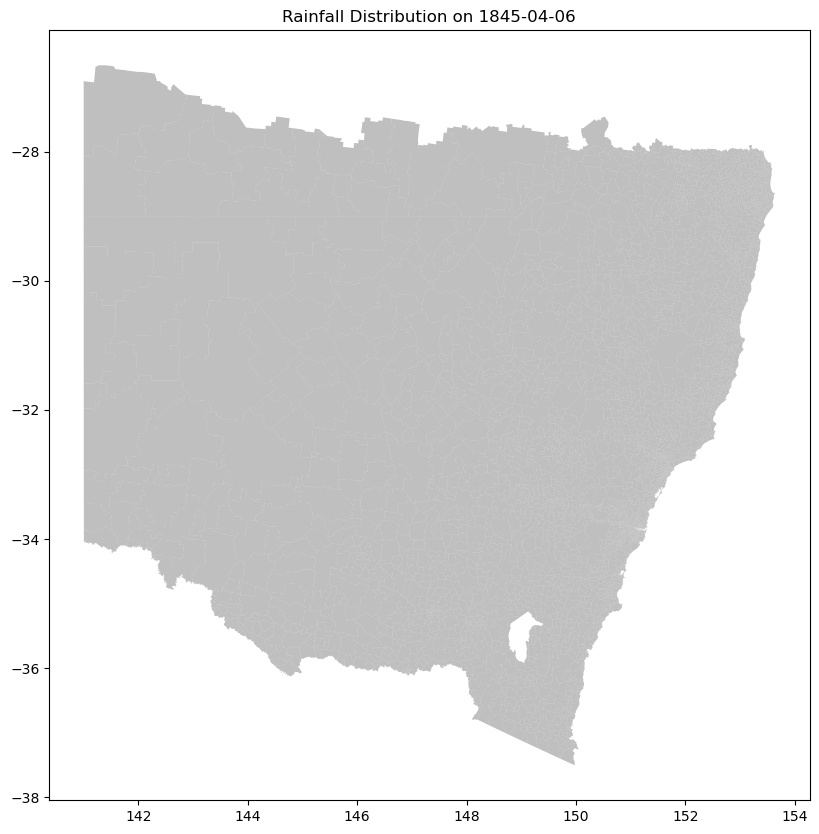

In [55]:
import os
import re
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Path to the combined shapefile
combined_shapefile = r'C:\Users\RUCHITSANDIP\Downloads\Downloads\combined_shapefile.shp'

# Read the combined shapefile
combined_gdf = gpd.read_file(combined_shapefile)

# Path to the Excel file containing event data
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\List of Events.xlsx'

# Read the Excel file, considering Sheet 2
event_df = pd.read_excel(excel_file, sheet_name='R1_99')

# Directory containing the station CSV files
directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\AshcroftL_AllYears'

# Path to save map plots
output_base_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

# Read the station data
station_df = pd.read_excel(r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx')
station_df['Latitude '] = station_df['Latitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)
station_df['Longitude '] = station_df['Longitude '].astype(str).str.replace(r'[^\d.-]', '', regex=True).astype(float)

def extract_date_range(event_text):
    if pd.isna(event_text):
        return None, None
    pattern = r'\d{4}-\d{2}-\d{2}'
    dates = re.findall(pattern, event_text)
    if len(dates) == 2:
        return pd.to_datetime(dates[0]), pd.to_datetime(dates[1])
    else:
        return None, None

# Function to plot and save map for a specific date
def plot_and_save_map(date, output_directory):
    # Extract year, month, and day
    year, month, day = date.year, date.month, date.day
    
    # Create a base plot
    fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the figure size as needed

    # Set the background color to white
    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')

    # Set plot title
    ax.set_title(f'Rainfall Distribution on {year}-{month:02d}-{day:02d}')

    # Plot the combined shapefile
    combined_gdf.plot(ax=ax, color='gray', alpha=0.5, edgecolor='none')

    # Load and plot rainfall data for the current date
    rainfall_data = []
    for index, row in station_df.iterrows():
        station_number = row['Bureau of Meteorology Station Number']
        latitude = row['Latitude ']
        longitude = row['Longitude ']

        # Find the corresponding CSV file in the directory
        csv_file = os.path.join(directory, f'0{station_number}.csv')

        # Check if the CSV file exists
        if os.path.exists(csv_file):
            # Read the CSV file into a DataFrame
            df_station = pd.read_csv(csv_file)

            # Filter rows for the specified date
            date_mask = (df_station['Year'] == year) & (df_station['Month'] == month) & (df_station['Day'] == day)
            df_filtered = df_station[date_mask]

            # Check if there is a valid rainfall value
            if not df_filtered.empty and df_filtered['Rainfall'].iloc[0] not in [None, -99.9, '']:
                rainfall = df_filtered['Rainfall'].iloc[0]
                rainfall_data.append({'Station Number': station_number, 'Latitude': latitude, 'Longitude': longitude, 'Rainfall': rainfall})

    # Convert the rainfall data to a DataFrame
    rainfall_df = pd.DataFrame(rainfall_data)

    # Set color map for rainfall intensity from green to blue to red
    cmap = mcolors.LinearSegmentedColormap.from_list('rainfall', ['white', 'blue', 'red'])
    norm = plt.Normalize(vmin=0, vmax=100)  # Normalization range from 0 to 100 mm

    # Plot the stations with color-coded markers based on rainfall values
    sc = ax.scatter(
        rainfall_df['Longitude'],
        rainfall_df['Latitude'],
        c=rainfall_df['Rainfall'],
        cmap=cmap,
        norm=norm,
        s=50,  # Marker size
        edgecolor='black',
        zorder=5
    )

    # Add a colorbar to the plot
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Rainfall (mm)')

    # Customize the plot appearance
    ax.set_axis_on()  # Hide the axes
    ax.grid(True, color='black', linestyle='--', linewidth=0.5)

    # Add a north arrow
    x, y, arrow_length = 0.95, 0.95, 0.05
    ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

    # Save the plot
    output_file = os.path.join(output_directory, f'Rainfall_Map_{year}-{month:02d}-{day:02d}.png')
    plt.savefig(output_file)
    plt.close()

# Set to keep track of processed dates
processed_dates = set()

# Iterate through each event and generate maps
for index, row in event_df.iterrows():
    # Extract event information
    event_text = row['Event']
    start_date, end_date = extract_date_range(event_text)
    
    if start_date is not None and end_date is not None:
        # Create a new directory for the event
        event_directory = os.path.join(output_base_directory, event_text)
        os.makedirs(event_directory, exist_ok=True)
        
        # Generate and save maps for each day within the date range
        current_date = start_date
        while current_date <= end_date:
            if current_date not in processed_dates:
                plot_and_save_map(current_date, event_directory)
                processed_dates.add(current_date)
            current_date += pd.Timedelta(days=1)

print("Maps have been generated and saved successfully.")



KeyboardInterrupt



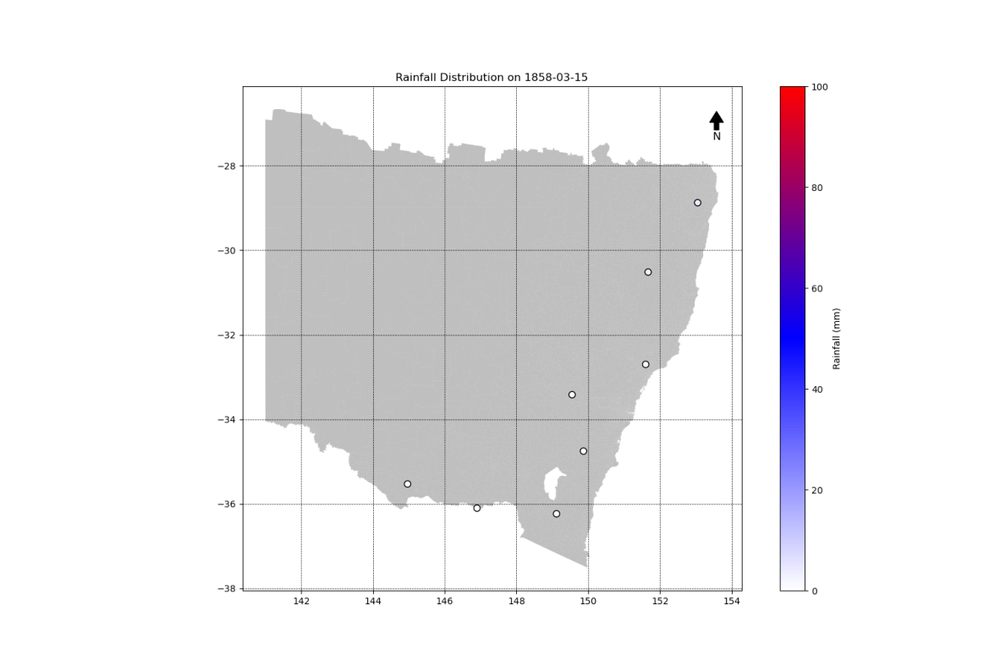

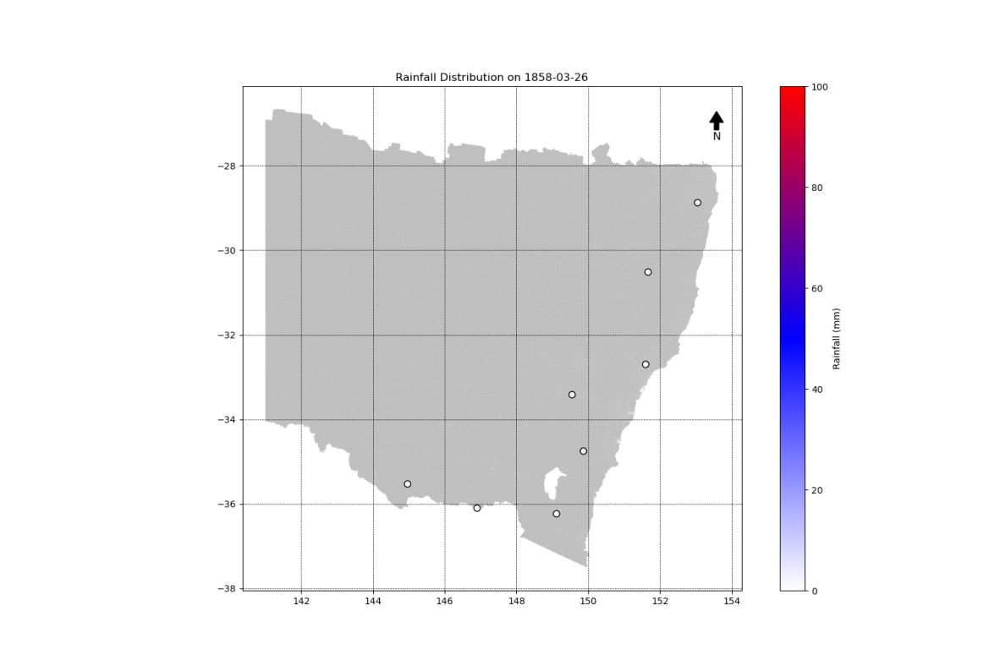

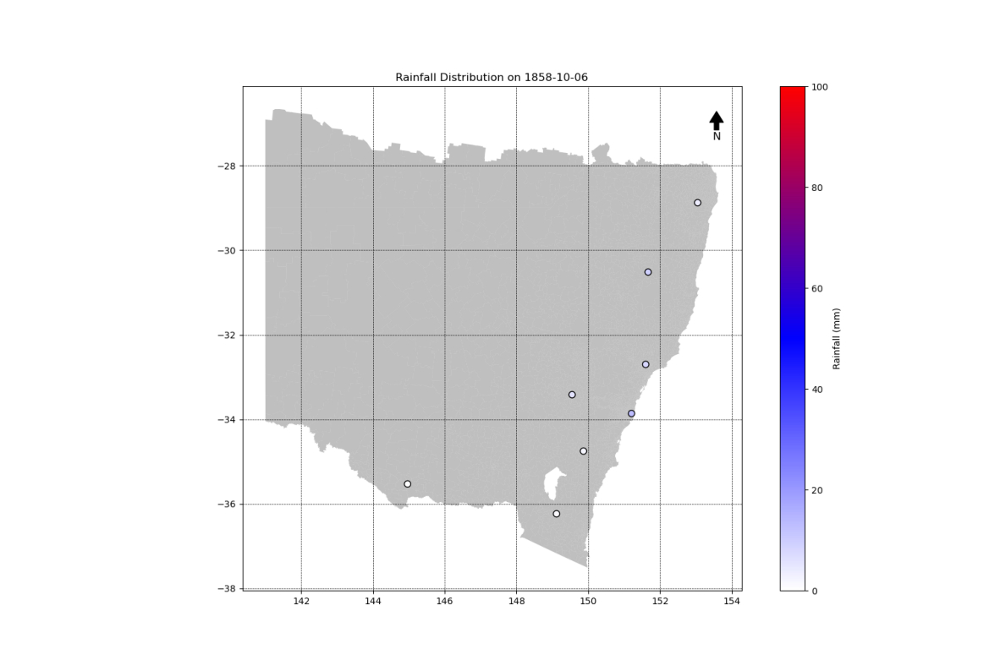

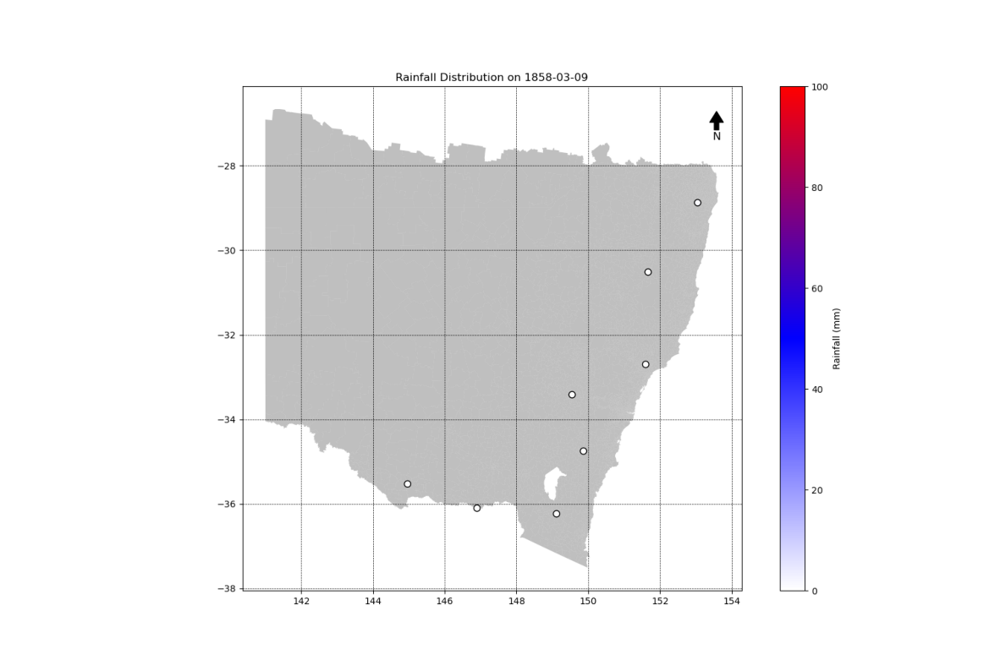

In [57]:
import os
import shutil
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

# Directory containing the map plots
map_plots_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

# Directory to save the animation
map_plots_animation_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots_animation'
os.makedirs(map_plots_animation_directory, exist_ok=True)

# Get list of directories in the map plots directory
event_directories = sorted([d for d in os.listdir(map_plots_directory) if os.path.isdir(os.path.join(map_plots_directory, d))])

# Dictionary to track available plots by date
available_plots = {}

# Iterate through each event directory
for event_directory in event_directories:
    # Get the event name and date range from the directory name
    event_name = event_directory
    
    # Directory containing the map plots for this event
    event_plots_directory = os.path.join(map_plots_directory, event_directory)
    
    # Get list of files in the event directory
    files = sorted([f for f in os.listdir(event_plots_directory) if f.endswith('.png')])

    # Check and copy missing plots from previous events
    for file in files:
        date_str = file.split('_')[-1].split('.')[0]
        available_plots[date_str] = os.path.join(event_plots_directory, file)

    # Ensure all dates are covered by plots
    for date_str, plot_path in available_plots.items():
        if not os.path.exists(os.path.join(event_plots_directory, f'Rainfall_Map_{date_str}.png')):
            shutil.copy2(plot_path, os.path.join(event_plots_directory, f'Rainfall_Map_{date_str}.png'))

    # Reload the file list to include copied plots
    files = sorted([f for f in os.listdir(event_plots_directory) if f.endswith('.png')])

    # Create a figure and axis for the animation
    fig, ax = plt.subplots(figsize=(15, 15), dpi=100)  # Adjust size and DPI as needed
    
    # Initialize function to update each frame
    def update(frame):
        ax.clear()
        img = plt.imread(os.path.join(event_plots_directory, files[frame]))
        ax.imshow(img)
        ax.axis('off')

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(files), interval=500)  # Adjust interval for animation speed
    
    # Clear previous output
    clear_output(wait=True)

    # Save the animation as a GIF
    start_date = files[0].split('_')[-1].split('.')[0]
    end_date = files[-1].split('_')[-1].split('.')[0]
    output_file = os.path.join(map_plots_animation_directory, f'{event_name}.gif')
    ani.save(output_file, writer='pillow', fps=2)

    # Display the animation with reduced gap
    animation_html = ani.to_jshtml()
    animation_html = animation_html.replace('<div', '<div style="margin-top: -5px"')  # Adjust margin-top as needed
    display(HTML(animation_html))

    print(f"The animation has been saved as '{output_file}'.")

print("All animations have been created and saved successfully.")



KeyboardInterrupt



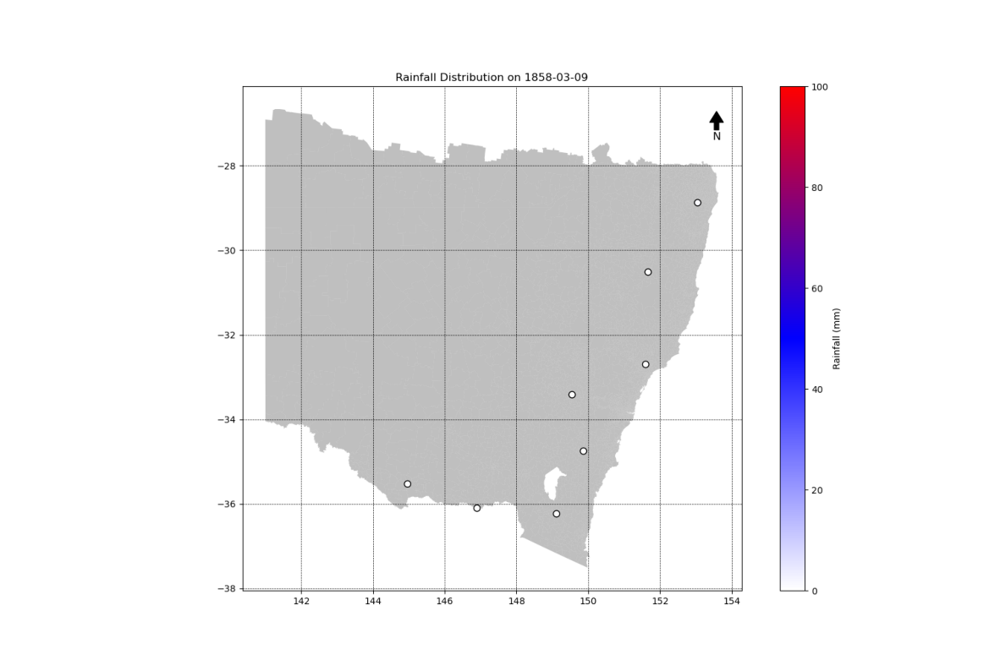

In [3]:
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

# Directory containing the map plots
main_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

# Get list of files in the directory
files = []
for root, dirs, filenames in os.walk(main_directory):
    for filename in filenames:
        if filename.endswith('.png'):
            files.append(os.path.join(root, filename))

files.sort()  # Sort the files

# Create a figure and axis for the animation
fig, ax = plt.subplots(figsize=(15, 15), dpi=100)  # Adjust size and DPI as needed

# Initialize function to update each frame
def update(frame):
    ax.clear()
    img = plt.imread(files[frame])
    ax.imshow(img)
    ax.axis('off')

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(files), interval=500)  # Adjust interval for animation speed

# Clear previous output
clear_output(wait=True)

# Save the animation as a GIF
output_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots_animation'
start_date = os.path.basename(files[0]).split('_')[-1].split('.')[0]
end_date = os.path.basename(files[-1]).split('_')[-1].split('.')[0]
output_file = os.path.join(output_directory, f'Rainfall_Distribution{start_date}_to_{end_date}.gif')
ani.save(output_file, writer='pillow', fps=2)

# Display the animation with reduced gap
animation_html = ani.to_jshtml()
animation_html = animation_html.replace('<div', '<div style="margin-top: -5px"')  # Adjust margin-top as needed
display(HTML(animation_html))

print(f"The animation has been saved as '{output_file}'.")


In [1]:
import os
import datetime
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

def get_date_from_filename(filename):
    # Extract date from filename assuming the format is 'Rainfall_Map_YYYY-MM-DD.png'
    date_str = filename.split('_')[-1].split('.')[0]
    return datetime.datetime.strptime(date_str, '%Y-%m-%d')

def gather_files_in_date_range(directory, start_date, end_date):
    files_in_range = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith('.png'):
                file_date = get_date_from_filename(file)
                if start_date <= file_date <= end_date:
                    files_in_range.append(os.path.join(root, file))
    return sorted(files_in_range)

def create_animation(files, output_file):
    # Create a new figure and axis for the animation
    fig, ax = plt.subplots(figsize=(15, 15), dpi=100)

    # Initialize function to update each frame
    def update(frame):
        ax.clear()
        img = plt.imread(files[frame])
        ax.imshow(img)
        ax.axis('off')

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(files), interval=500)  # Adjust interval for animation speed

    # Save the animation as a GIF
    ani.save(output_file, writer='pillow', fps=2)

    # Close the figure to free up memory
    plt.close(fig)

    print(f"The animation has been saved as '{output_file}'.")

# Main directory containing the subfolders with map plots
main_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

# Get user input for date range
start_date_str = input("Enter the start date (YYYY-MM-DD): ")
end_date_str = input("Enter the end date (YYYY-MM-DD): ")
start_date = datetime.datetime.strptime(start_date_str, '%Y-%m-%d')
end_date = datetime.datetime.strptime(end_date_str, '%Y-%m-%d')

# Gather files in the specified date range
files_in_range = gather_files_in_date_range(main_directory, start_date, end_date)

if not files_in_range:
    print("No files found in the specified date range.")
else:
    # Save the animation as a GIF
    output_directory = os.path.join(main_directory, 'animations')
    os.makedirs(output_directory, exist_ok=True)
    output_file = os.path.join(output_directory, f'Rainfall_Distribution_{start_date_str}_to_{end_date_str}.gif')

    # Create the animation
    create_animation(files_in_range, output_file)


Enter the start date (YYYY-MM-DD):  1859-12-25
Enter the end date (YYYY-MM-DD):  1859-12-31


The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots\animations\Rainfall_Distribution_1859-12-25_to_1859-12-31.gif'.


In [4]:
import os
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

def get_date_from_filename(filename):
    # Extract date from filename assuming the format is 'Rainfall_Map_YYYY-MM-DD.png'
    date_str = filename.split('_')[-1].split('.')[0]
    return datetime.datetime.strptime(date_str, '%Y-%m-%d')

def gather_files_in_date_range(directory, start_date, end_date):
    files_in_range = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith('.png'):
                file_date = get_date_from_filename(file)
                if start_date <= file_date <= end_date:
                    files_in_range.append(os.path.join(root, file))
    return sorted(files_in_range)

def create_animation(files, output_file):
    # Create a new figure and axis for the animation
    fig, ax = plt.subplots(figsize=(15, 15), dpi=100)

    # Initialize function to update each frame
    def update(frame):
        ax.clear()
        img = plt.imread(files[frame])
        ax.imshow(img)
        ax.axis('off')

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(files), interval=500)  # Adjust interval for animation speed

    # Save the animation as a GIF
    ani.save(output_file, writer='pillow', fps=2)

    # Close the figure to free up memory
    plt.close(fig)

    print(f"The animation has been saved as '{output_file}'.")

# Main directory containing the subfolders with map plots
main_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots'

# Path to the Excel file
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\List of Events.xlsx'

# Read the Excel file
df = pd.read_excel(excel_file)

# Process each event
for event in df['Event']:
    try:
        event_dates = event.split('- ')[1].strip().split(' to ')
        start_date_str = event_dates[0]
        end_date_str = event_dates[1]
        start_date = datetime.datetime.strptime(start_date_str, '%Y-%m-%d')
        end_date = datetime.datetime.strptime(end_date_str, '%Y-%m-%d')

        # Gather files in the specified date range
        files_in_range = gather_files_in_date_range(main_directory, start_date, end_date)

        if not files_in_range:
            print(f"No files found for the event '{event}'.")
            continue

        # Save the animation as a GIF
        output_directory = os.path.join(main_directory, 'animations')
        os.makedirs(output_directory, exist_ok=True)
        output_file = os.path.join(output_directory, f'Rainfall_Distribution_{start_date_str}_to_{end_date_str}.gif')

        # Create the animation
        create_animation(files_in_range, output_file)
    except Exception as e:
        print(f"Error processing event '{event}': {e}")


The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots\animations\Rainfall_Distribution_1841-01-18_to_1841-01-24.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots\animations\Rainfall_Distribution_1841-01-28_to_1841-02-03.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots\animations\Rainfall_Distribution_1842-02-18_to_1842-02-24.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots\animations\Rainfall_Distribution_1842-03-04_to_1842-03-10.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\Map_plots\animations\Rainfall_Distribut

In [15]:
import os
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

def get_date_from_filename(filename):
    # Extract date from filename assuming the format is 'Rainfall_Map_YYYY-MM-DD.png'
    date_str = filename.split('_')[-1].split('.')[0]
    return datetime.datetime.strptime(date_str, '%Y-%m-%d')

def gather_files_in_date_range(directory, start_date, end_date):
    files_in_range = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.startswith('Rainfall_Map') and file.endswith('.png'):
                try:
                    file_date = get_date_from_filename(file)
                    if start_date <= file_date <= end_date:
                        files_in_range.append(os.path.join(root, file))
                except ValueError:
                    # Skip files that don't match the date format
                    continue
    return sorted(files_in_range)

def create_animation(files, output_file):
    # Create a new figure and axis for the animation
    fig, ax = plt.subplots(figsize=(15, 15), dpi=100)

    # Initialize function to update each frame
    def update(frame):
        ax.clear()
        img = plt.imread(files[frame])
        ax.imshow(img)
        ax.axis('off')

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(files), interval=500)  # Adjust interval for animation speed

    # Save the animation as a GIF
    ani.save(output_file, writer='pillow', fps=2)

    # Close the figure to free up memory
    plt.close(fig)

    print(f"The animation has been saved as '{output_file}'.")

# Main directory containing the subfolders with map plots
main_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Map_plots_1'

# Path to the Excel file
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\List of Events.xlsx'

# Read the Excel file
df = pd.read_excel(excel_file)

# Process the first event for trial
first_event = df['Event'].iloc[0]
try:
    event_dates = first_event.split('- ')[1].strip().split(' to ')
    start_date_str = event_dates[0]
    end_date_str = event_dates[1]
    start_date = datetime.datetime.strptime(start_date_str, '%Y-%m-%d')
    end_date = datetime.datetime.strptime(end_date_str, '%Y-%m-%d')

    # Gather files in the specified date range
    files_in_range = gather_files_in_date_range(main_directory, start_date, end_date)

    if not files_in_range:
        print(f"No files found for the event '{first_event}'.")
    else:
        # Save the animation as a GIF
        output_directory = os.path.join(main_directory, 'animations')
        os.makedirs(output_directory, exist_ok=True)
        output_file = os.path.join(output_directory, f'Rainfall_Distribution_{start_date_str}_to_{end_date_str}.gif')

        # Create the animation
        create_animation(files_in_range, output_file)

except Exception as e:
    print(f"Error processing event '{first_event}': {e}")


The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Map_plots_1\animations\Rainfall_Distribution_1889-07-14_to_1889-07-20.gif'.


The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Map_plots_1\animations\Rainfall_Distribution_1889-07-14_to_1889-07-20.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Map_plots_1\animations\Rainfall_Distribution_1890-01-10_to_1890-01-16.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Map_plots_1\animations\Rainfall_Distribution_1890-01-11_to_1890-01-17.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Map_plots_1\animations\Rainfall_Distribution_1890-01-29_to_1890-02-04.gif'.
The animation has been saved as 'C:\Users\RUCHITSANDIP\OneDrive - The University of 

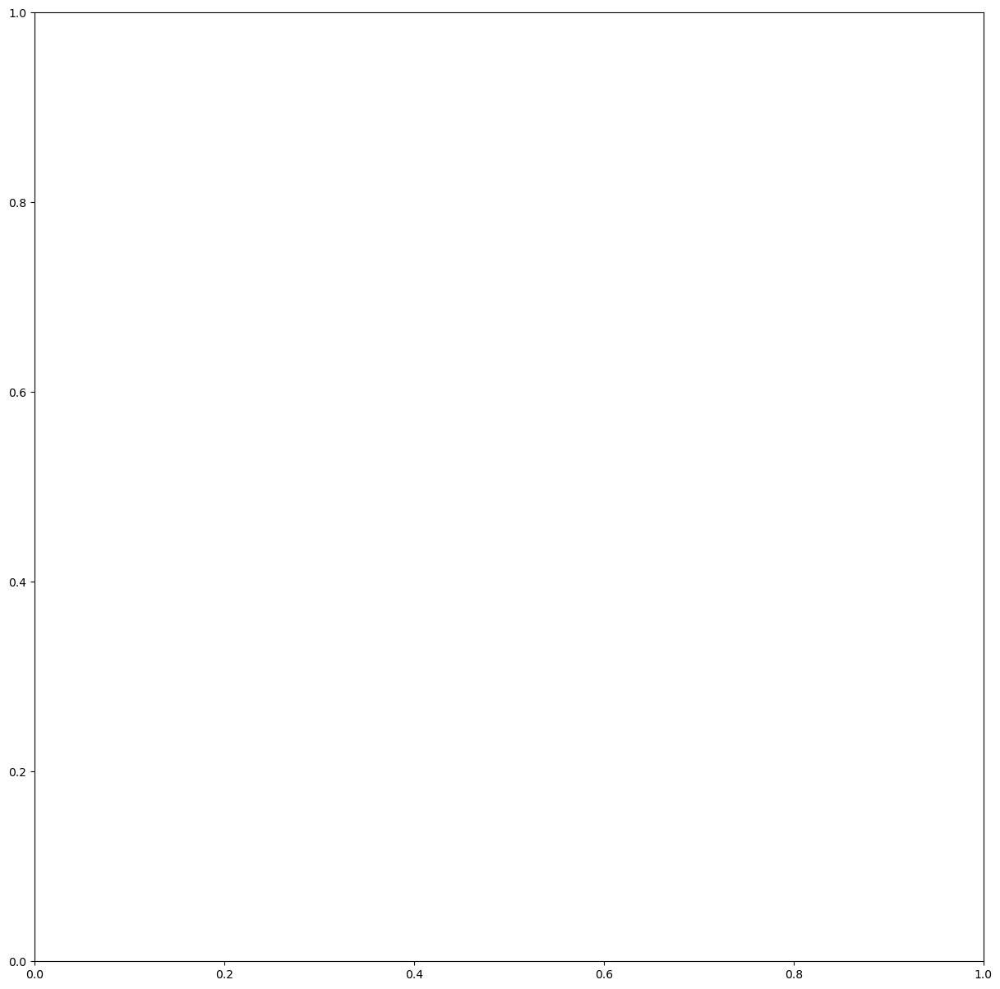

In [1]:
import os
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display, clear_output

def get_date_from_filename(filename):
    # Extract date from filename assuming the format is 'Rainfall_Map_YYYY-MM-DD.png'
    date_str = filename.split('_')[-1].split('.')[0]
    return datetime.datetime.strptime(date_str, '%Y-%m-%d')

def gather_files_in_date_range(directory, start_date, end_date):
    files_in_range = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.startswith('Rainfall_Map') and file.endswith('.png'):
                try:
                    file_date = get_date_from_filename(file)
                    if start_date <= file_date <= end_date:
                        files_in_range.append(os.path.join(root, file))
                except ValueError:
                    # Skip files that don't match the date format
                    continue
    return sorted(files_in_range)

def create_animation(files, output_file):
    # Create a new figure and axis for the animation
    fig, ax = plt.subplots(figsize=(15, 15), dpi=100)

    # Initialize function to update each frame
    def update(frame):
        ax.clear()
        img = plt.imread(files[frame])
        ax.imshow(img)
        ax.axis('off')

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(files), interval=1500)  # Adjust interval for animation speed

    # Save the animation as a GIF
    ani.save(output_file, writer='pillow', fps=1)

    # Close the figure to free up memory
    plt.close(fig)

    print(f"The animation has been saved as '{output_file}'.")

# Main directory containing the subfolders with map plots
main_directory = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Map_plots_1'

# Path to the Excel file
excel_file = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\List of Events.xlsx'

# Read the Excel file
df = pd.read_excel(excel_file)

# Process each event
for event in df['Event']:
    try:
        if ' - ' not in event or ' to ' not in event:
            print(f"Malformed event string, attempting to process: '{event}'")
            # Attempt to find dates in the string
            try:
                dates = [datetime.datetime.strptime(date.strip(), '%Y-%m-%d') for date in event.split() if '-' in date]
                if len(dates) == 2:
                    start_date, end_date = dates
                else:
                    print(f"Could not parse dates from event: '{event}'")
                    continue
            except ValueError:
                print(f"Failed to parse dates for event: '{event}'")
                continue
        else:
            event_dates = event.split(' - ')[1].strip().split(' to ')
            if len(event_dates) != 2:
                print(f"Unexpected date format in event: '{event}'")
                continue

            start_date_str = event_dates[0]
            end_date_str = event_dates[1]

            try:
                start_date = datetime.datetime.strptime(start_date_str, '%Y-%m-%d')
                end_date = datetime.datetime.strptime(end_date_str, '%Y-%m-%d')
            except ValueError as ve:
                print(f"Invalid date format in event: '{event}' - {ve}")
                continue

        # Gather files in the specified date range
        files_in_range = gather_files_in_date_range(main_directory, start_date, end_date)

        if not files_in_range:
            print(f"No files found for the event '{event}'.")
            continue

        # Save the animation as a GIF
        output_directory = os.path.join(main_directory, 'animations')
        os.makedirs(output_directory, exist_ok=True)
        output_file = os.path.join(output_directory, f'Rainfall_Distribution_{start_date_str}_to_{end_date_str}.gif')

        # Create the animation
        create_animation(files_in_range, output_file)

    except Exception as e:
        print(f"Error processing event '{event}': {e}")


In [1]:
import pandas as pd

# Load the two Excel files
file1_path = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\Station_list_names.xlsx'
file2_path = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\BoM 3 Station list.xlsx'

# Read the first Excel file
df1 = pd.read_excel(file1_path)

# Read the second Excel file
df2 = pd.read_excel(file2_path)

# Extract the relevant columns
stations_df1 = df1['Bureau of Meteorology Station Number'].astype(str)
stations_df2 = df2['Station Number'].astype(str)

# Find the station numbers in the first file that are not in the second file
unique_stations = stations_df1[~stations_df1.isin(stations_df2)].unique()

# Create a new DataFrame with these unique station numbers
unique_stations_df = pd.DataFrame(unique_stations, columns=['Unique Station Numbers'])

# Write these unique station numbers to a new sheet in the second Excel file
with pd.ExcelWriter(file2_path, engine='openpyxl', mode='a') as writer:
    unique_stations_df.to_excel(writer, sheet_name='Unique Stations', index=False)

print("Unique station numbers have been added to a new sheet in the second Excel file.")


Unique station numbers have been added to a new sheet in the second Excel file.


In [3]:
import pandas as pd

# Load the second Excel file
file2_path = r'C:\Users\RUCHITSANDIP\OneDrive - The University of Melbourne\Documents\Documents\Master thesis Data\BoM Station Dataset\BoM 3 Station list.xlsx'

# Read the second Excel file
df2_original = pd.read_excel(file2_path, sheet_name='Sheet 2')  # Assuming the original sheet is named 'Sheet1'
df2_unique = pd.read_excel(file2_path, sheet_name='Unique Stations')

# Extract the 'Station Number' column from both sheets
station_numbers_original = df2_original['Station Number'].astype(str)
station_numbers_unique = df2_unique['Unique Station Numbers'].astype(str)

station_numbers_original.head(), station_numbers_unique.head()


(0    44096
 1    41038
 2    44181
 3    44043
 4    41101
 Name: Station Number, dtype: object,
 0    58142
 1    68137
 2    68054
 3    58056
 4    58017
 Name: Unique Station Numbers, dtype: object)

In [10]:
import pandas as pd

# Load the necessary Excel files
second_excel_file_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/BoM 3 Station list.xlsx'
third_excel_file_path = '/Users/coolkarni/Desktop/OneDrive - The University of MelbourneR1_99_New Events.xlsx'

# Read the second Excel file
df2_original = pd.read_excel(second_excel_file_path, sheet_name='Sheet 2')  # Assuming the original sheet is named 'Sheet 2'

# Extract the 'Station Number' column from the original sheet
station_numbers_original = df2_original['Station Number'].astype(str).unique()

# Read the third Excel file
df3 = pd.read_excel(third_excel_file_path)

# Function to filter out events
def filter_events(group, station_numbers_original):
    # Check if any station number in the group is in the original station numbers
    for station in group['Station Number']:
        if pd.isna(station):
            continue
        if str(station).split(': ')[1] in station_numbers_original:
            return True
    return False

# Split the data into events based on the presence of the 'Event' column
event_indices = df3[df3['Event'].notna()].index.tolist()
event_indices.append(len(df3))

filtered_events = pd.DataFrame()

for i in range(len(event_indices) - 1):
    start_idx = event_indices[i]
    end_idx = event_indices[i+1]
    event_group = df3.iloc[start_idx:end_idx]
    if not filter_events(event_group, station_numbers_original):
        filtered_events = pd.concat([filtered_events, event_group], ignore_index=True)

# Write the filtered events to a new sheet in the third Excel file
with pd.ExcelWriter(third_excel_file_path, engine='openpyxl', mode='a') as writer:
    filtered_events.to_excel(writer, sheet_name='Filtered Events', index=False)

print("Filtered events have been written to a new sheet in the third Excel file.")


Filtered events have been written to a new sheet in the third Excel file.


In [4]:
import pandas as pd

# Load the necessary Excel files
second_excel_file_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/BoM 3 Station list.xlsx'
third_excel_file_path = '/Users/coolkarni/Desktop/OneDrive - The University of Melbourne/R1_99_New Events.xlsx'

# Read the second Excel file
df2_original = pd.read_excel(second_excel_file_path, sheet_name='Sheet 2')  # Assuming the original sheet is named 'Sheet 2'

# Extract the 'Station Number' column from the original sheet
station_numbers_original = df2_original['Station Number'].astype(str).unique()

# Read the third Excel file
df3 = pd.read_excel(third_excel_file_path)

# Function to filter out events
def filter_events(group, station_numbers_original):
    # Check if any station number in the group is in the original station numbers
    for station in group['Station Number']:
        if pd.isna(station):
            continue
        if str(station).split(': ')[1] in station_numbers_original:
            return True
    return False

# Split the data into events based on the presence of the 'Event' column
event_indices = df3[df3['Event'].notna()].index.tolist()
event_indices.append(len(df3))

filtered_events = pd.DataFrame()

for i in range(len(event_indices) - 1):
    start_idx = event_indices[i]
    end_idx = event_indices[i+1]
    event_group = df3.iloc[start_idx:end_idx]
    if not filter_events(event_group, station_numbers_original):
        filtered_events = pd.concat([filtered_events, event_group], ignore_index=True)

# Write the filtered events to a new sheet in the third Excel file
with pd.ExcelWriter(third_excel_file_path, engine='openpyxl', mode='a') as writer:
    filtered_events.to_excel(writer, sheet_name='Filtered Events', index=False)

print("Filtered events have been written to a new sheet in the third Excel file.")


Filtered events have been written to a new sheet in the third Excel file.


In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from scipy.ndimage import gaussian_filter
from scipy.stats import gaussian_kde

# Define directories and file paths
input_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events'
output_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_IDW_KDE_plots'
shapefile_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/combined_shapefile.shp'
excel_file_path = '/Users/coolkarni/Desktop/OneDrive - The University of Melbourne/R1_99_New Events.xlsx'  # Replace with the actual path to your Excel file

# Create output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Read the shapefile
gdf = gpd.read_file(shapefile_path)

# Get the bounds of the shapefile
minx, miny, maxx, maxy = gdf.total_bounds

# Create a grid of points within the bounds
xi, yi = np.meshgrid(np.linspace(minx, maxx, 100), np.linspace(miny, maxy, 100))
zi = np.zeros(xi.shape)

# Read the Excel file and get the event names
excel_df = pd.read_excel(excel_file_path, sheet_name='Sheet5')
event_names = excel_df['Event'].dropna().unique()

# Function to perform Gaussian KDE
def perform_gaussian_kde(latitude, longitude, rainfall):
    try:
        xy = np.vstack([longitude, latitude])
        kde = gaussian_kde(xy, weights=rainfall, bw_method='scott')
        zi = kde(np.vstack([xi.flatten(), yi.flatten()])).reshape(xi.shape)
        zi_smoothed = gaussian_filter(zi, sigma=2)
        return zi_smoothed, None
    except Exception as e:
        return None, str(e)

# Function to perform IDW interpolation
def perform_idw(latitude, longitude, rainfall):
    try:
        for i in range(len(xi)):
            for j in range(len(yi)):
                distances = np.sqrt((longitude.values - xi[i, j])**2 + (latitude.values - yi[i, j])**2)
                weights = 1 / (distances + 1e-6)
                zi[i, j] = np.sum(weights * rainfall.values) / np.sum(weights)
        zi_smoothed = gaussian_filter(zi, sigma=2)
        return zi_smoothed, None
    except Exception as e:
        return None, str(e)

# Process each event
for event_name in event_names:
    try:
        # Construct the CSV file path
        csv_file_name = f'{event_name}.csv'
        csv_file_path = os.path.join(input_directory, csv_file_name)

        # Load the CSV file
        df = pd.read_csv(csv_file_path)

        # Extract necessary columns
        latitude = df['Latitude']
        longitude = df['Longitude']

        # Interpolate the rainfall data on the grid for each day
        rainfall_columns = [col for col in df.columns if 'Rainfall' in col]
        daily_means = []

        # Store peak points and colors
        peak_points = []
        peak_colors = []
        method_used = ""

        for col in rainfall_columns:
            method_used = ""  # Initialize method_used inside the loop
            x_cleaned = df[['Latitude', 'Longitude', col]].dropna()
            rainfall = x_cleaned[col]
            latitude = x_cleaned['Latitude']
            longitude = x_cleaned['Longitude']

            # First try Gaussian KDE method
            zi_smoothed, error = perform_gaussian_kde(latitude, longitude, rainfall)
            if error:
                print(f'Gaussian KDE failed for {event_name} on column {col}: {error}')
                # If KDE fails, try IDW method
                zi_smoothed, error = perform_idw(latitude, longitude, rainfall)
                if error:
                    print(f'IDW interpolation failed for {event_name} on column {col}: {error}')
                    continue
                else:
                    method_used = "IDW"
            else:
                method_used = "Gaussian KDE"

            # Detect the highest peak (center of the contour)
            peak_index = np.unravel_index(np.nanargmax(zi_smoothed), zi_smoothed.shape)
            peak_y, peak_x = peak_index

            # Mask the grid to include only points inside the shapefile geometry
            points = np.vstack((xi.flatten(), yi.flatten())).T
            mask = np.array([gdf.contains(Point(point)).any() for point in points])
            mask = mask.reshape(xi.shape)
            zi_smoothed = np.where(mask, zi_smoothed, np.nan)

            # Extract stations within the 90th percentile of the highest shaded contour
            contour_level = np.percentile(zi_smoothed[~np.isnan(zi_smoothed)], 90)
            contour_stations = x_cleaned[(zi_smoothed[(np.digitize(latitude, yi[:, 0]), np.digitize(longitude, xi[0]))] >= contour_level)]

            # Extract top 5 stations with highest rainfall
            top_stations = contour_stations.nlargest(5, col)

            # Apply .describe() to these stations
            top_stations_description = top_stations.describe()

            # Calculate daily mean rainfall
            daily_mean = top_stations[col].mean()
            daily_means.append(daily_mean)

            # Store peak points
            peak_points.append((xi[peak_y, peak_x], yi[peak_y, peak_x]))

        # Calculate total mean of all daily means and 25th percentile
        total_mean = np.mean(daily_means)
        percentile_25th = np.percentile(daily_means, 25)

        # Determine peak colors based on the 25th percentile
        peak_colors = ['red' if mean > percentile_25th else 'green' for mean in daily_means]

        # Plotting the map with peaks connected by lines and annotated
        fig, ax = plt.subplots(figsize=(10, 8))
        gdf.plot(ax=ax, color='gray', edgecolor='none')

        # Plot contours
        for col in rainfall_columns:
            x_cleaned = df[['Latitude', 'Longitude', col]].dropna()
            rainfall = x_cleaned[col]
            latitude = x_cleaned['Latitude']
            longitude = x_cleaned['Longitude']

            # First try Gaussian KDE method
            zi_smoothed, error = perform_gaussian_kde(latitude, longitude, rainfall)
            if error:
                # If KDE fails, try IDW method
                zi_smoothed, error = perform_idw(latitude, longitude, rainfall)

            if zi_smoothed is not None:
                points = np.vstack((xi.flatten(), yi.flatten())).T
                mask = np.array([gdf.contains(Point(point)).any() for point in points])
                mask = mask.reshape(xi.shape)
                zi_smoothed = np.where(mask, zi_smoothed, np.nan)

        

        # Connect peaks with lines and annotate
        for i, (point, color) in enumerate(zip(peak_points, peak_colors)):
            ax.plot(point[0], point[1], 'o', color=color)
            if i > 0 and color == 'red' and peak_colors[i - 1] == 'red':
                prev_point = peak_points[i - 1]
                ax.plot([prev_point[0], point[0]], [prev_point[1], point[1]], color='red')
            ax.annotate(f'{i+1}', xy=point, xytext=(5, -5), textcoords='offset points')

        # Set the title to the event name
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_title(f'({event_name})')

        # Save the plot
        output_file_path = os.path.join(output_directory, f'{event_name}.png')
        plt.savefig(output_file_path)
        plt.close()

        print(f'Successfully processed: {event_name} using {method_used} method')

    except Exception as e:
        print(f'Error processing {event_name}: {e}')


Successfully processed: Event 550 - 1879-11-17 to 1879-11-23 using Gaussian KDE method
Successfully processed: Event 551 - 1880-03-24 to 1880-03-30 using Gaussian KDE method
Successfully processed: Event 552 - 1884-07-18 to 1884-07-24 using Gaussian KDE method
Successfully processed: Event 553 - 1881-09-07 to 1881-09-13 using Gaussian KDE method
Successfully processed: Event 554 - 1887-12-28 to 1888-01-03 using Gaussian KDE method
Successfully processed: Event 555 - 1889-10-03 to 1889-10-09 using Gaussian KDE method
Successfully processed: Event 556 - 1890-05-15 to 1890-05-21 using Gaussian KDE method
Successfully processed: Event 557 - 1896-01-29 to 1896-02-04 using Gaussian KDE method
Successfully processed: Event 558 - 1896-12-15 to 1896-12-21 using Gaussian KDE method
Successfully processed: Event 559 - 1878-09-07 to 1878-09-13 using Gaussian KDE method
Successfully processed: Event 560 - 1880-03-20 to 1880-03-26 using Gaussian KDE method
Successfully processed: Event 561 - 1892-09

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 564 - 1899-01-09 to 1899-01-15 on column Rainfall 1899-01-15: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 564 - 1899-01-09 to 1899-01-15 using IDW method
Gaussian KDE failed for Event 565 - 1884-04-22 to 1884-04-28 on column Rainfall 1884-04-23: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Successfully processed: Event 565 - 1884-04-22 to 1884-04-28 using Gaussian KDE method
Successfully processed: Event 566 - 1890-02-27 to 1890-03-05 using Gaussian KDE method
Gaussian KDE failed for Event 567 - 1883-03-17 to 1883-03-23 on column Rainfall 1883-03-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 567 - 1883-03-17 to 1883-03-23 using Gaussian KDE method
Successfully processed: Event 568 - 1887-04-02 to 1887-04-08 using Gaussian KDE method
Successfully processed: Event 569 - 1881-03-25 to 1881-03-31 using Gaussian KDE method
Gaussian KDE failed for Event 570 - 1887-03-17 to 1887-03-23 on column Rainfall 1887-03-20: aweights cannot be negative
Successfully processed: Event 570 - 1887-03-17 to 1887-03-23 using Gaussian KDE method
Successfully processed: Event 571 - 1894-01-03 to 1894-01-09 using Gaussian KDE method
Successfully processed: Event 572 - 1900-01-08 to 1900-01-14 using Gaussian KDE method
Successfully processed: Event 573 - 1893-11-06 to 1893-11-12 using Gaussian KDE method
Successfully processed: Event 574 - 1898-10-19 to 1898-10-25 using Gaussian KDE method
Successfully processed: Event 575 - 1890-04-08 to 1890-04-14 using Gaussian KDE method
Successfully processed: Event 576 - 1891-01-27 to 1891-02-02 using Gaussian KDE method
Gaussian K

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 597 - 1879-01-30 to 1879-02-05 on column Rainfall 1879-02-05: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 597 - 1879-01-30 to 1879-02-05 using IDW method
Successfully processed: Event 598 - 1879-03-02 to 1879-03-08 using Gaussian KDE method
Successfully processed: Event 599 - 1891-04-16 to 1891-04-22 using Gaussian KDE method
Successfully processed: Event 600 - 1897-10-16 to 1897-10-22 using Gaussian KDE method
Successfully processed: Event 601 - 1896-11-29 to 1896-12-05 using Gaussian KDE method
Successfully processed: Event 602 - 1899-02-25 to 1899-03-03 using Gaussian KDE method
Gaussian KDE failed for Event 603 - 1886-07-15 to 1886-07-21 on column Rainfall 1886-07-20: aweights cannot be negative
Successfully processed: Event 603 - 1886-07-15 to 1886-07-21 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 604 - 1873-06-17 to 1873-06-23 on column Rainfall 1873-06-23: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 604 - 1873-06-17 to 1873-06-23 using IDW method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 605 - 1878-03-24 to 1878-03-30 on column Rainfall 1878-03-30: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 605 - 1878-03-24 to 1878-03-30 using IDW method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 606 - 1880-12-06 to 1880-12-12 on column Rainfall 1880-12-10: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 606 - 1880-12-06 to 1880-12-12 using Gaussian KDE method
Successfully processed: Event 607 - 1881-03-03 to 1881-03-09 using Gaussian KDE method
Successfully processed: Event 608 - 1881-04-24 to 1881-04-30 using Gaussian KDE method
Successfully processed: Event 609 - 1882-07-05 to 1882-07-11 using Gaussian KDE method
Successfully processed: Event 610 - 1888-09-21 to 1888-09-27 using Gaussian KDE method
Successfully processed: Event 611 - 1889-09-16 to 1889-09-22 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 612 - 1869-04-07 to 1869-04-13 on column Rainfall 1869-04-12: array must not contain infs or NaNs
Gaussian KDE failed for Event 612 - 1869-04-07 to 1869-04-13 on column Rainfall 1869-04-13: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 612 - 1869-04-07 to 1869-04-13 using IDW method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 613 - 1869-05-16 to 1869-05-22 on column Rainfall 1869-05-21: array must not contain infs or NaNs
Gaussian KDE failed for Event 613 - 1869-05-16 to 1869-05-22 on column Rainfall 1869-05-22: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 613 - 1869-05-16 to 1869-05-22 using IDW method
Gaussian KDE failed for Event 614 - 1870-01-13 to 1870-01-19 on column Rainfall 1870-01-17: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 614 - 1870-01-13 to 1870-01-19 on column Rainfall 1870-01-18: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 614 - 1870-01-13 to 1870-01-19 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 615 - 1870-08-10 to 1870-08-16 on column Rainfall 1870-08-16: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 615 - 1870-08-10 to 1870-08-16 using IDW method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 616 - 1870-08-19 to 1870-08-25 on column Rainfall 1870-08-20: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 616 - 1870-08-19 to 1870-08-25 on column Rainfall 1870-08-21: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 616 - 1870-08-19 to 1870-08-25 on column Rainfall 1870-08-23: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 616 - 1870-08-19 to 1870-08-25 using Gaussian KDE method
Gaussian KDE failed for Event 617 - 1873-12-09 to 1873-12-15 on column Rainfall 1873-12-09: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Gaussian KDE failed for Event 617 - 1873-12-09 to 1873-12-15 on column Rainfall 1873-12-10: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Successfully processed: Event 617 - 1873-12-09 to 1873-12-15 using Gaussian KDE method
Successfully processed: Event 618 - 1874-07-01 to 1874-07-07 using Gaussian KDE method
Successfully processed: Event 619 - 1875-02-11 to 1875-02-17 using Gaussian KDE method
Successfully processed: Event 620 - 1877-01-24 to 1877-01-30 using Gaussian KDE method
Gaussian KDE failed for Event 621 - 1882-01-13 to 1882-01-19 on column Rainfall 1882-01-14: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Gaussian KDE failed for Event 621 - 1882-01-13 to 1882-01-19 on column Rainfall 1882-01-19: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted 

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 622 - 1882-12-09 to 1882-12-15 on column Rainfall 1882-12-14: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 622 - 1882-12-09 to 1882-12-15 using Gaussian KDE method
Successfully processed: Event 623 - 1893-11-11 to 1893-11-17 using Gaussian KDE method
Successfully processed: Event 624 - 1897-12-09 to 1897-12-15 using Gaussian KDE method
Successfully processed: Event 625 - 1879-05-20 to 1879-05-26 using Gaussian KDE method
Successfully processed: Event 626 - 1881-01-19 to 1881-01-25 using Gaussian KDE method
Successfully processed: Event 627 - 1883-10-25 to 1883-10-31 using Gaussian KDE method
Successfully processed: Event 628 - 1884-02-10 to 1884-02-16 using Gaussian KDE method
Gaussian KDE failed for Event 629 - 1886-07-31 to 1886-08-06 on column Rainfall 1886-08-02: aweights cannot be negative
Successfully processed: Event 629 - 1886-07-31 to 1886-08-06 using Gaussian KDE method
Successfully processed: Event 630 - 1888-01-28 to 1888-02-03 using Gaussian KDE method
Successfully processed: Event 631 - 1885-02-21 to 1885-02-27 using Gaussian KDE method
Successful

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 649 - 1876-04-05 to 1876-04-11 on column Rainfall 1876-04-06: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 649 - 1876-04-05 to 1876-04-11 using Gaussian KDE method
Gaussian KDE failed for Event 650 - 1889-10-29 to 1889-11-04 on column Rainfall 1889-10-31: aweights cannot be negative
Successfully processed: Event 650 - 1889-10-29 to 1889-11-04 using Gaussian KDE method
Successfully processed: Event 651 - 1883-08-18 to 1883-08-24 using Gaussian KDE method
Successfully processed: Event 652 - 1891-02-24 to 1891-03-02 using Gaussian KDE method
Successfully processed: Event 653 - 1894-06-19 to 1894-06-25 using Gaussian KDE method
Successfully processed: Event 654 - 1899-03-23 to 1899-03-29 using Gaussian KDE method
Successfully processed: Event 655 - 1895-12-14 to 1895-12-20 using Gaussian KDE method
Successfully processed: Event 656 - 1895-12-01 to 1895-12-07 using Gaussian KDE method
Gaussian KDE failed for Event 657 - 1889-08-26 to 1889-09-01 on column Rainfall 1889-08-31: aweights cannot be negative
Successfully processed: Event 657 - 1889-08-26 to 1889-09-01 usi

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 659 - 1876-12-27 to 1877-01-02 on column Rainfall 1876-12-29: array must not contain infs or NaNs
Gaussian KDE failed for Event 659 - 1876-12-27 to 1877-01-02 on column Rainfall 1876-12-30: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 659 - 1876-12-27 to 1877-01-02 using Gaussian KDE method
Successfully processed: Event 660 - 1878-07-09 to 1878-07-15 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 661 - 1880-01-06 to 1880-01-12 on column Rainfall 1880-01-12: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 661 - 1880-01-06 to 1880-01-12 using IDW method
Successfully processed: Event 662 - 1898-03-18 to 1898-03-24 using Gaussian KDE method
Successfully processed: Event 663 - 1891-09-04 to 1891-09-10 using Gaussian KDE method
Successfully processed: Event 664 - 1895-09-18 to 1895-09-24 using Gaussian KDE method
Successfully processed: Event 665 - 1896-04-19 to 1896-04-25 using Gaussian KDE method
Successfully processed: Event 666 - 1888-03-28 to 1888-04-03 using Gaussian KDE method
Successfully processed: Event 667 - 1893-11-17 to 1893-11-23 using Gaussian KDE method
Successfully processed: Event 668 - 1896-01-25 to 1896-01-31 using Gaussian KDE method
Successfully processed: Event 669 - 1890-09-12 to 1890-09-18 using Gaussian KDE method
Successfully processed: Event 670 - 1893-02-26 to 1893-03-04 using Gaussian KDE method
Successfully processed: Event 671 - 1879-02-18 to 1879-02-24 using Gaussian KDE method
Gaussian KDE failed for Event 672 - 1881-02-11 to 18

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 672 - 1881-02-11 to 1881-02-17 on column Rainfall 1881-02-16: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 672 - 1881-02-11 to 1881-02-17 on column Rainfall 1881-02-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 672 - 1881-02-11 to 1881-02-17 using IDW method
Successfully processed: Event 673 - 1879-07-28 to 1879-08-03 using Gaussian KDE method
Successfully processed: Event 674 - 1893-10-08 to 1893-10-14 using Gaussian KDE method
Gaussian KDE failed for Event 675 - 1858-05-24 to 1858-05-30 on column Rainfall 1858-05-24: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Successfully processed: Event 675 - 1858-05-24 to 1858-05-30 using Gaussian KDE method
Gaussian KDE failed for Event 676 - 1860-02-07 to 1860-02-13 on column Rainfall 1860-02-07: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Successfully processed: Event 676 - 1860-02-07 to 1860-02-13 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 677 - 1861-02-13 to 1861-02-19 on column Rainfall 1861-02-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 677 - 1861-02-13 to 1861-02-19 on column Rainfall 1861-02-18: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 677 - 1861-02-13 to 1861-02-19 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 678 - 1872-10-01 to 1872-10-07 on column Rainfall 1872-10-02: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 678 - 1872-10-01 to 1872-10-07 using Gaussian KDE method
Successfully processed: Event 679 - 1875-02-02 to 1875-02-08 using Gaussian KDE method
Successfully processed: Event 680 - 1877-09-23 to 1877-09-29 using Gaussian KDE method
Successfully processed: Event 681 - 1877-10-17 to 1877-10-23 using Gaussian KDE method
Successfully processed: Event 682 - 1877-12-12 to 1877-12-18 using Gaussian KDE method
Successfully processed: Event 683 - 1892-04-27 to 1892-05-03 using Gaussian KDE method
Successfully processed: Event 684 - 1882-01-25 to 1882-01-31 using Gaussian KDE method
Successfully processed: Event 685 - 1897-06-16 to 1897-06-22 using Gaussian KDE method
Successfully processed: Event 686 - 1900-02-19 to 1900-02-25 using Gaussian KDE method
Gaussian KDE failed for Event 687 - 1885-11-23 to 1885-11-29 on column Rainfall 1885-11-25: aweights cannot be negative
Successfully processed: Event 687 - 1885-11-23 to 1885-11-29 using Gaussian KDE method
Successful

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 692 - 1872-12-18 to 1872-12-24 on column Rainfall 1872-12-19: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 692 - 1872-12-18 to 1872-12-24 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 693 - 1874-10-24 to 1874-10-30 on column Rainfall 1874-10-28: array must not contain infs or NaNs
Gaussian KDE failed for Event 693 - 1874-10-24 to 1874-10-30 on column Rainfall 1874-10-29: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 693 - 1874-10-24 to 1874-10-30 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 694 - 1875-03-26 to 1875-04-01 on column Rainfall 1875-04-01: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 694 - 1875-03-26 to 1875-04-01 using IDW method
Successfully processed: Event 695 - 1877-03-01 to 1877-03-07 using Gaussian KDE method
Successfully processed: Event 696 - 1878-05-07 to 1878-05-13 using Gaussian KDE method
Successfully processed: Event 697 - 1882-03-03 to 1882-03-09 using Gaussian KDE method
Successfully processed: Event 698 - 1885-01-09 to 1885-01-15 using Gaussian KDE method
Successfully processed: Event 699 - 1886-06-08 to 1886-06-14 using Gaussian KDE method
Successfully processed: Event 700 - 1899-01-16 to 1899-01-22 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 701 - 1870-10-17 to 1870-10-23 on column Rainfall 1870-10-22: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 701 - 1870-10-17 to 1870-10-23 using Gaussian KDE method
Gaussian KDE failed for Event 702 - 1870-11-10 to 1870-11-16 on column Rainfall 1870-11-10: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Gaussian KDE failed for Event 702 - 1870-11-10 to 1870-11-16 on column Rainfall 1870-11-11: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Successfully processed: Event 702 - 1870-11-10 to 1870-11-16 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 703 - 1871-01-11 to 1871-01-17 on column Rainfall 1871-01-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 703 - 1871-01-11 to 1871-01-17 using IDW method
Successfully processed: Event 704 - 1873-08-04 to 1873-08-10 using Gaussian KDE method
Gaussian KDE failed for Event 705 - 1874-05-17 to 1874-05-23 on column Rainfall 1874-05-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 705 - 1874-05-17 to 1874-05-23 on column Rainfall 1874-05-18: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 705 - 1874-05-17 to 1874-05-23 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 706 - 1877-01-09 to 1877-01-15 on column Rainfall 1877-01-14: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 706 - 1877-01-09 to 1877-01-15 on column Rainfall 1877-01-15: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 706 - 1877-01-09 to 1877-01-15 using IDW method
Successfully processed: Event 707 - 1878-03-20 to 1878-03-26 using Gaussian KDE method
Successfully processed: Event 708 - 1879-05-27 to 1879-06-02 using Gaussian KDE method
Successfully processed: Event 709 - 1879-10-05 to 1879-10-11 using Gaussian KDE method
Successfully processed: Event 710 - 1880-10-20 to 1880-10-26 using Gaussian KDE method
Gaussian KDE failed for Event 711 - 1886-05-16 to 1886-05-22 on column Rainfall 1886-05-18: aweights cannot be negative
Successfully processed: Event 711 - 1886-05-16 to 1886-05-22 using Gaussian KDE method
Successfully processed: Event 712 - 1887-03-28 to 1887-04-03 using Gaussian KDE method
Successfully processed: Event 713 - 1900-04-27 to 1900-05-03 using Gaussian KDE method
Successfully processed: Event 714 - 1896-11-16 to 1896-11-22 using Gaussian KDE method
Successfully processed: Event 715 - 1890-06-04 to 1890-06-10 using Gaussian KDE method
Gaussian KDE failed

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 720 - 1886-11-04 to 1886-11-10 on column Rainfall 1886-11-10: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Successfully processed: Event 720 - 1886-11-04 to 1886-11-10 using IDW method
Successfully processed: Event 721 - 1884-01-18 to 1884-01-24 using Gaussian KDE method
Successfully processed: Event 722 - 1884-09-24 to 1884-09-30 using Gaussian KDE method
Successfully processed: Event 723 - 1870-02-27 to 1870-03-05 using Gaussian KDE method
Successfully processed: Event 724 - 1872-10-08 to 1872-10-14 using Gaussian KDE method
Gaussian KDE failed for Event 725 - 1877-01-28 to 1877-02-03 on column Rainfall 1877-02-01: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Successfully processed: Event 725 - 1877-01-28 to 1877-02-03 using Gaussian KDE method
Successfully processed: Event 726 - 1887

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Gaussian KDE failed for Event 727 - 1873-12-30 to 1874-01-05 on column Rainfall 1874-01-01: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 727 - 1873-12-30 to 1874-01-05 on column Rainfall 1874-01-02: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 727 - 1873-12-30 to 1874-01-05 on column Rainfall 1874-01-03: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divid

Successfully processed: Event 727 - 1873-12-30 to 1874-01-05 using Gaussian KDE method


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Gaussian KDE failed for Event 728 - 1878-06-11 to 1878-06-17 on column Rainfall 1878-06-16: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Successfully processed: Event 728 - 1878-06-11 to 1878-06-17 using Gaussian KDE method
Successfully processed: Event 729 - 1879-08-10 to 1879-08-16 using Gaussian KDE method
Successfully processed: Event 730 - 1879-11-07 to 1879-11-13 using Gaussian KDE method
Successfully processed: Event 731 - 1870-10-27 to 1870-11-02 using Gaussian KDE method
Successfully processed: Event 732 - 1871-01-06 to 1871-01-12 using Gaussian KDE method
